In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Data.xlsx to Data (1).xlsx


In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import io

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

In [ ]:
df = pd.read_excel(io.BytesIO(uploaded['Data (1).xlsx']))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4336 entries, 0 to 4335
Columns: 196 entries, Q1r1 - To begin, what is your age? to FINAL WEIGHTS
dtypes: float64(40), int64(13), object(143)
memory usage: 6.5+ MB


- first 2132 entries are from DDS11 (2016), the rest 2205 entries are from DDS10.
- DDS10 lack values in 'QNEW29 family subscription login content type'

In [ ]:
new_column_names = ['Q1 age', 'Q4 gender', 'Q2 state', 'region', 'QNEW3 employement status', 'Q5 ethnicity',
               'QNEW1 children status', 'QNEW2 children age_0~4', 'QNEW2 children age_5~9', 'QNEW2 children age_10~13', 'QNEW2 children age_14~18', 'QNEW2 children age_19~25', 'QNEW2 children age_26+','QNEW2 children age_idk',
               'Q6 annual household EBT category',
               'Q8 equipment own_TV', 'Q8 equipment own_DVR', 'Q8 equipment own_Streaming Box', 'Q8 equipment own_Streaming Stick', 'Q8 equipment own_Digital TV Antenna', 'Q8 equipment own_DVD Player', 'Q8 equipment own_Gaming Console', 'Q8 equipment own_Portable Game Player', 'Q8 equipment own_Router', 'Q8 equipment own_Desktop', 'Q8 equipment own_Laptop', 'Q8 equipment own_Tablet', 'Q8 equipment own_E-book Reader', 'Q8 equipment own_Smartphone', 'Q8 equipment own_Non-smart phone', 'Q8 equipment own_Smart Watch', 'Q8 equipment own_Fitness Band', 'Q8 equipment own_VR Headset', 'Q8 equipment own_Drone', 'Q8 equipment own_Other', 'Q8 equipment own_idk',
               'Q10 plan to buy_TV', 'Q10 plan to buy_DVR', 'Q10 plan to buy_Streaming Box', 'Q10 plan to buy_Streaming Stick', 'Q10 plan to buy_Digital TV Antenna', 'Q10 plan to buy_DVD Player', 'Q10 plan to buy_Gaming Console', 'Q10 plan to buy_Portable Game Player', 'Q10 plan to buy_Router', 'Q10 plan to buy_Desktop', 'Q10 plan to buy_Laptop', 'Q10 plan to buy_Tablet', 'Q10 plan to buy_E-book Reader', 'Q10 plan to buy_Smartphone', 'Q10 plan to buy_Non-smart phone', 'Q10 plan to buy_Smart Watch', 'Q10 plan to buy_Fitness Band', 'Q10 plan to buy_VR Headset', 'Q10 plan to buy_Drone', 'Q10 plan to buy_Other', 'Q10 plan to buy_idk',
               'Q11 equipment rank_TV', 'Q11 equipment rank_DVR', 'Q11 equipment rank_Streaming Box', 'Q11 equipment rank_Streaming Stick', 'Q11 equipment rank_Digital TV Antenna', 'Q11 equipment rank_DVD Player', 'Q11 equipment rank_Gaming Console', 'Q11 equipment rank_Portable Game Player', 'Q11 equipment rank_Router', 'Q11 equipment rank_Desktop', 'Q11 equipment rank_Laptop', 'Q11 equipment rank_Tablet', 'Q11 equipment rank_E-book Reader', 'Q11 equipment rank_Smartphone', 'Q11 equipment rank_Non-smart phone', 'Q11 equipment rank_Smart Watch', 'Q11 equipment rank_Fitness Band', 'Q11 equipment rank_VR Headset', 'Q11 equipment rank_Drone', 'Q11 refused to rank',
               'Q15 movie time percentage_Smartphone', 'Q15 movie time percentage_Tablet', 'Q15 movie time percentage_Computer', 'Q15 movie time percentage_TV',
               'Q16 sports time percentage_Smartphone', 'Q16 sports time percentage_Tablet', 'Q16 sports time percentage_Computer', 'Q16 sports time percentage_TV',
               'Q17 show time percentage_Smartphone', 'Q17 show time percentage_Tablet', 'Q17 show time percentage_Computer', 'Q17 show time percentage_TV',
               'Q22 app used frequently_Photo/video', 'Q22 app used frequently_Banking', 'Q22 app used frequently_Fitness/health', 'Q22 app used frequently_Food/drink', 'Q22 app used frequently_Retail/shopping', 'Q22 app used frequently_Navigation', 'Q22 app used frequently_Social media', 'Q22 app used frequently_Reading', 'Q22 app used frequently_Music Streaming', 'Q22 app used frequently_Video Streaming', 'Q22 app used frequently_Reviews/Guides', 'Q22 app used frequently_News Consolidator', 'Q22 app used frequently_Newspaper/broadcaster', 'Q22 app used frequently_Magazines', 'Q22 app used frequently_Diagnostics/utilities', 'Q22 app used frequently_QR Scan', 'Q22 app used frequently_Travel', 'Q22 app used frequently_Transportation', 'Q22 app used frequently_Location', 'Q22 app used frequently_Language', 'Q22 app used frequently_Movie', 'Q22 app used frequently_Business', 'Q22 app used frequently_Games', 'Q22 app used frequently_Productivity', 'Q22 app used frequently_Sports', 'Q22 app used frequently_Weather', 'Q22 app used frequently_Browser', 'Q22 app used frequently_VOIP', 'Q22 app used frequently_Dating', 'Q22 app used frequently_Messaging', 'Q22 app used frequently_Mobile Payment', 'Q22 app used frequently_Education', 'Q22 app used frequently_Tickets', 'Q22 app used frequently_Reservations', 'Q22 app used frequently_Hobby', 'Q22 app used frequently_Not any', 'Q22 app used frequently_idk',
               'Q26 subscription_TV', 'Q26 subscription_Home internet', 'Q26 subscription_Landline telephone', 'Q26 subscription_Mobile voice', 'Q26 subscription_Mobile Data', 'Q26 subscription_Video streaming', 'Q26 subscription_Music streaming', 'Q26 subscription_Gaming', 'Q26 subscription_News', 'Q26 subscription_Magazine', 'Q26 subscription_None', 'Q26 subscription_idk',
               'Q36 subscription rank_TV', 'Q36 subscription rank_Home internet', 'Q36 subscription rank_Landline telephone', 'Q36 subscription rank_Mobile voice', 'Q36 subscription rank_Mobile Data', 'Q36 subscription rank_Video streaming', 'Q36 subscription rank_Music streaming', 'Q36 subscription rank_Gaming', 'Q36 subscription rank_News', 'Q36 subscription rank_Magazine',
               'Q29 opinion and willingness to pay more for faster internet',
               'Q37 entertainment activities rank_Live performances', 'Q37 entertainment activities rank_Movies', 'Q37 entertainment activities rank_Watch TV', 'Q37 entertainment activities rank_Listen to music', 'Q37 entertainment activities rank_Read books', 'Q37 entertainment activities rank_Read magazines', 'Q37 entertainment activities rank_Read newspapers', 'Q37 entertainment activities rank_Listen to radio', 'Q37 entertainment activities rank_play video games', 'Q37 entertainment activities rank_Use the Internet for social/personal interests',
               'QNEW19 movie methods frequency_Rent disc', 'QNEW19 movie methods frequency_Buy disc', 'QNEW19 movie methods frequency_Buy digital resource', 'QNEW19 movie methods frequency_Rent digital resource', 'QNEW19 movie methods frequency_Stream online', 'QNEW19 movie methods frequency_TV service provider',
               'QNEW20 TV program methods frequency_Rent disc', 'QNEW20 TV program methods frequency_Buy disc', 'QNEW20 TV program methods frequency_Buy digital resource', 'QNEW20 TV program methods frequency_Stream online', 'QNEW20 TV program methods frequency_TV service provider',
               'QNEW24 binge-watch status',
               'QNEW28 family subscription login status', 'QNEW29 family subscription login content type',
               'Q73 multitask when watching TV_Read for work/school', 'Q73 multitask when watching TV_Read for pleasure', 'Q73 multitask when watching TV_Surf the Internet', 'Q73 multitask when watching TV_Microblogging', 'Q73 multitask when watching TV_Read email', 'Q73 multitask when watching TV_Write email', 'Q73 multitask when watching TV_Text message', 'Q73 multitask when watching TV_Use social network', 'Q73 multitask when watching TV_Talk on the phone', 'Q73 multitask when watching TV_Browse products online', 'Q73 multitask when watching TV_Purchase products online', 'Q73 multitask when watching TV_Play video games',
               'Q39 pay for not being exposed to ads_News', 'Q39 pay for not being exposed to ads_Sports', 'Q39 pay for not being exposed to ads_Games', 'Q39 pay for not being exposed to ads_Music', 'Q39 pay for not being exposed to ads_TV shows', 'Q39 pay for not being exposed to ads_Movies',
               'Q39r2 Willing to provide personal info for customized ads', 'Q39r3 Worry about identity theft if provide more personal info', 'Q39r4 Willing to see more ads if it reduces subscription cost',
               'Q89 most frequently used mechanism to get news', 'FINAL WEIGHTS'
]
#len(new_column_names)
df.columns = new_column_names
df.head()

# Q11 refused to rank: 1/3 (third priority), 2/3 (second priority), 3/3 (first priority), 0 (Asked Not Ranked)

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

- Q8, Q10, Q11 Equipment types: _**TV**, DVR, Streaming Box, Streaming Stick, Digital TV Antenna, DVD Player, Gaming Console, Portable Game Player, Router, **Desktop, Laptop**, **Tablet**, E-book Reader, **Smartphone**, Non-smart phone, Smart Watch, Fitness Band, VR Headset, Drone, Other, idk_
- Q22 App types: _Photo/video, Banking, Fitness/health, Food/drink, Retail/shopping, Navigation, Social media, Reading, Music Streaming, Video Streaming, Reviews/Guides, News Consolidator, Newspaper/broadcaster, Magazines, Diagnostics/utilities, QR Scan, Travel, Transportation, Location, Language, Movie, Business, Games, Productivity, Sports, Weather, Browser, VOIP, Dating, Messaging, Mobile Payment, Education, Tickets, Reservations, Hobby, Not any, idk_
- Q26, Q36 Subscription types: _TV, Home internet, Landline telephone, Mobile voice, Mobile Data, Video streaming, Music streaming, Gaming, News, Magazine, None, idk_
- Q37 entertainment activities: _Live performances, Movies, Watch TV, Listen to music, Read books, Read magazines, Read newspapers, Listen to radio, play video games, Use the Internet for social/personal interests_
- QNEW19 movie methods: _Rent disc, Buy disc, Buy digital resource, Rent digital resource, Stream online, TV service provider_
- QNEW20 TV program methods: _Rent disc, Buy disc, Buy digital resource, Stream online, TV service provider_
- Q73 multitask when watching TV type: _Read for work/school, Read for pleasure, Surf the Internet, Microblogging, Read email, Write email, Text message, Use social network, Talk on the phone, Browse products online, Purchase products online, Play video games_
- Q39 pay for ____ online for not being exposed to ads: _News, Sports, Games, Music, TV shows, Movies_
- Q39r2, r3, r4: _Willing to provide personal info for customized ads, Worry about identity theft if provide more personal info, Willing to see more ads if it reduces subscription cost_

## 1. Treat Structural Missing Values
### As they mostly appears in those YES/NO questions, we treat null as the same with no, therefore gives out 0.
#### We keep all the raw data in **df**, new copy called **df_new** is created with raw categorial data and null values substituted with 0.

In [ ]:

df_new = df.copy()
df_new = df_new.fillna(0)
df_new.head()

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

## 2. Convert Binary "Yes/No" into 1 and 0
#### From now on, we convert most of the categorial data in **df_new** to numbers and stored them in a new copy called **df_numbers**.

In [ ]:
df_numbers = df_new.copy()
df_numbers = df_numbers.replace({'Yes': 1, 'No': 0})
df_numbers.head()

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

## 3. Convert 5 Levels of Agreement to numbers in Q39
### They distribute evenly, and we set the total interval to be within 1.
- Agree strongly(1), Agree somewhat(0.75), N/A; I do not have a basis to answer(0.5), Disagree somewhat(0.25), Disagree strongly(0).

In [ ]:
df_numbers = df_numbers.replace({'Agree strongly': 1, 'Agree somewhat': 0.75, 'N/A; I do not have a basis to answer': 0.5, 'Disagree somewhat': 0.25, 'Disagree strongly' : 0})
df_numbers.head()

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

## 4. Convert Frequency to numbers (they are not distributed that evenly!)
### QNEW19, QNEW20, QNEW28. We set the total interval to be 1, so use average times/365 as the numeric.
- Frequently (every day/weekly): 52/365
- Occasionally (monthly): 12/365
- Rarely (one to three times a year) : 3/365
- Never: 0


In [ ]:
df_numbers = df_numbers.replace({'Frequently (every day/weekly)': 52/365, 'Occasionally (monthly)': 12/365, 'Rarely (one to three times a year)': 3/365, 'Never': 0})
df_numbers.head()

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

### Q73. We still set the total interval to be 1, so use the interval mean of the percentage as numeric value.
- Always (close to 100% of the time): 1
- Almost always (greater than 75% of the time): 0.875
- Frequently (between 50% and 75% of the time): 0.625
- Rarely (10%-50% of the time): 0.3
- Almost never: 0.05


In [ ]:
df_numbers = df_numbers.replace({'Always (close to 100% of the time)': 1,'Almost always (greater than 75% of the time)': 0.875,
                 'Frequently (between 50% and 75% of the time)': 0.625, 'Rarely (10%-50% of the time)': 0.3, 'Almost never': 0.05})
df_numbers.head()

,Q1 age,Q4 gender,Q2 state,region,QNEW3 employement status,Q5 ethnicity,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q6 annual household EBT category,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q11 refused to rank,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscriptio

### 5. Convert those top-three ranks to numbers
#### Q11 equipment rank & Q36 subscription rank. 'Q11 refused to rank' column is left alone, you can drop it later
- 1 (most important) is still 1.
- 2 (less important) is now 2/3.
- 3 (least important) is now 1/3.
- 0 (null values showing participants don't think they are important) still 0.

In [ ]:
q11_cols = df_numbers.filter(like='Q11', axis=1).columns
df_numbers[q11_cols] = df_numbers[q11_cols].replace({2: 2/3, 3: 1/3})
# df_numbers['Q11 equipment rank_DVR'].value_counts() # example here

In [ ]:
q36_cols = df_numbers.filter(like='Q36', axis=1).columns
df_numbers[q36_cols] = df_numbers[q36_cols].replace({2: 2/3, 3: 1/3})
df_numbers['Q36 subscription rank_Magazine'].value_counts() # example here

0.000000    4060
0.333333     133
0.666667      78
1.000000      65
Name: Q36 subscription rank_Magazine, dtype: int64

### 6. save the lists for object columns and numeric columns

In [ ]:
object_columns = df_numbers.select_dtypes(include=['object']).columns
object_columns

Index(['Q4 gender', 'Q2 state', 'region', 'QNEW3 employement status',
       'Q5 ethnicity', 'Q6 annual household EBT category',
       'Q11 refused to rank',
       'Q29 opinion and willingness to pay more for faster internet',
       'QNEW29 family subscription login content type',
       'Q89 most frequently used mechanism to get news'],
      dtype='object')

In [ ]:
numeric_columns = df_numbers.select_dtypes(include=np.number).columns.tolist()
numeric_columns

['Q1 age',
 'QNEW1 children status',
 'QNEW2 children age_0~4',
 'QNEW2 children age_5~9',
 'QNEW2 children age_10~13',
 'QNEW2 children age_14~18',
 'QNEW2 children age_19~25',
 'QNEW2 children age_26+',
 'QNEW2 children age_idk',
 'Q8 equipment own_TV',
 'Q8 equipment own_DVR',
 'Q8 equipment own_Streaming Box',
 'Q8 equipment own_Streaming Stick',
 'Q8 equipment own_Digital TV Antenna',
 'Q8 equipment own_DVD Player',
 'Q8 equipment own_Gaming Console',
 'Q8 equipment own_Portable Game Player',
 'Q8 equipment own_Router',
 'Q8 equipment own_Desktop',
 'Q8 equipment own_Laptop',
 'Q8 equipment own_Tablet',
 'Q8 equipment own_E-book Reader',
 'Q8 equipment own_Smartphone',
 'Q8 equipment own_Non-smart phone',
 'Q8 equipment own_Smart Watch',
 'Q8 equipment own_Fitness Band',
 'Q8 equipment own_VR Headset',
 'Q8 equipment own_Drone',
 'Q8 equipment own_Other',
 'Q8 equipment own_idk',
 'Q10 plan to buy_TV',
 'Q10 plan to buy_DVR',
 'Q10 plan to buy_Streaming Box',
 'Q10 plan to buy_Str

# EDA

Checking for summary statistics, missing values, correlations and distributions.

In [ ]:
# checking summary statistics
df[new_column_names].describe()

,Q1 age,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q36 subscription rank_TV,Q36 subscription rank_Home internet,Q36 subscription rank_Landline telephone,Q36 subscription rank_Mobile voice,Q36 subscription rank_Mobile Data,Q36 subscription rank_Video streaming,Q36 subscription rank_Music streaming,Q36 subscription rank_Gaming,Q36 subscription rank_News,Q36 subscription rank_Magazine,Q37 entertainment activities rank_Live performances,Q37 entertainment activities rank_Movies,Q37 entertainment activities rank_Watch TV,Q37 entertainment activities rank_Listen to music,Q37 entertainment activities rank_Read books,Q37 entertainment activities rank_Read magazines,Q37 entertainment activities rank_Read newspapers,Q37 entertainment activities rank_Listen to radio,Q37 entertainment activities rank_play video games,Q37 entertainment activities rank_Use the Internet for social/personal interests,FINAL WEIGHTS
count,4336.000000,1536.000000,330.000000,216.000000,123.000000,146.000000,281.000000,799.000000,150.000000,812.000000,1532.000000,2177.000000,833.000000,131.000000,2347.000000,409.000000,111.000000,128.000000,61.000000,49.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.000000,4336.00000,4336.000000,4336.000000,4336.000000,4336.000000,2107.000000,3145.000000,975.000000,975.000000,1310.000000,1340.000000,350.000000,562.000000,425.000000,276.000000,828.000000,1170.000000,2602.000000,1627.000000,1191.000000,486.000000,755.000000,687.000000,1209.000000,2453.000000,4336.000000
mean,42.678967,2.108073,2.421212,2.291667,2.276423,2.171233,2.412811,2.180225,2.220000,2.220443,1.605091,1.722554,2.248499,2.251908,1.750320,2.339853,2.090090,2.320312,2.180328,1.897959,8.739622,7.593865,26.042205,43.935194,6.624077,4.803275,16.290360,37.24262,8.362315,7.486624,24.827260,46.246310,1.885619,1.559300,2.137436,2.200000,1.997710,2.170896,2.222857,2.101423,2.275294,2.246377,1.992754,2.045299,1.804766,2.133989,2.032746,2.358025,2.136424,2.250364,2.047974,1.876478,1.000000
std,19.982386,0.790852,0.728181,0.779460,0.792390,0.790980,0.727309,0.794757,0.818166,0.762516,0.747773,0.747675,0.749648,0.797530,0.790957,0.733913,0.815192,0.783025,0.826805,0.847666,18.997548,17.946183,34.811151,43.468046,17.777007,15.093780,30.772962,45.04329,19.320497,18.673379,34.966313,44.412502,0.786711,0.711857,0.835299,0.800411,0.804396,0.766097,0.787832,0.784451,0.772143,0.811836,0.837423,0.838855,0.799082,0.783749,0.815667,0.728936,0.795335,0.773973,0.822499,0.798544,1.167552
min,14.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.009211
25%,25.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.00000



*   Max age is 99 year-old
*   count: 2,131



In [ ]:
# to verify number of null values
print(df[new_column_names].isnull().sum())

Q1 age                                                            0
Q4 gender                                                         0
Q2 state                                                          0
region                                                            0
QNEW3 employement status                                          0
                                                                 ..
Q39r2 Willing to provide personal info for customized ads         0
Q39r3 Worry about identity theft if provide more personal info    0
Q39r4 Willing to see more ads if it reduces subscription cost     0
Q89 most frequently used mechanism to get news                    0
FINAL WEIGHTS                                                     0
Length: 196, dtype: int64


Confirmed that we do not have any NULL values now.

In [ ]:
# Observe data types
data_types = df.dtypes
print(data_types)

Q1 age                                                              int64
Q4 gender                                                          object
Q2 state                                                           object
region                                                             object
QNEW3 employement status                                           object
                                                                   ...   
Q39r2 Willing to provide personal info for customized ads          object
Q39r3 Worry about identity theft if provide more personal info     object
Q39r4 Willing to see more ads if it reduces subscription cost      object
Q89 most frequently used mechanism to get news                     object
FINAL WEIGHTS                                                     float64
Length: 196, dtype: object


In [ ]:
# Select only numeric columns from the DataFrame
numeric_df = df[new_column_names].select_dtypes(include='number')

# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Create a correlation heatmap using Seaborn

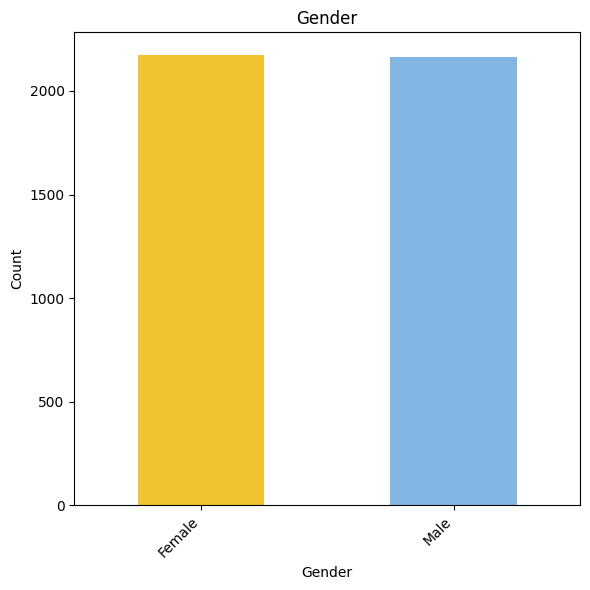

In [ ]:
gender_category_counts = df_new['Q4 gender'].value_counts()

plt.figure(figsize=(6, 6))
colors = ["#f1c231", "#83b6e3"]


gender_category_counts.plot(kind='bar', color=colors)
plt.title('Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

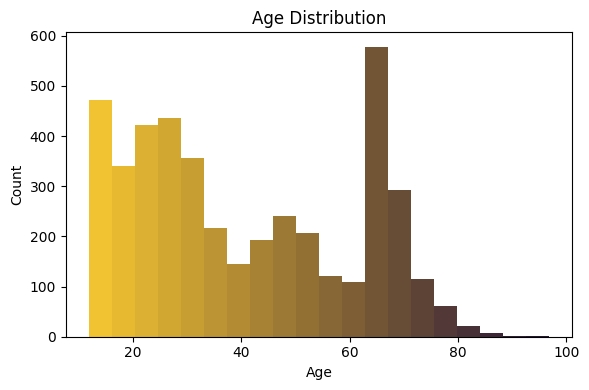

In [ ]:
from matplotlib.colors import LinearSegmentedColormap


colors = ["#f1c231", "#281538"]
n_bins = 20  # Number of bins in the histogram
cmap_name = 'my_list'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Calculate the histogram
hist, bins = np.histogram(df['Q1 age'], bins=n_bins)

# Plot each bar individually
plt.figure(figsize=(6, 4))
for i in range(len(hist)):
    plt.bar(bins[i], hist[i], width=bins[i+1]-bins[i], color=cm(i / n_bins))


plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

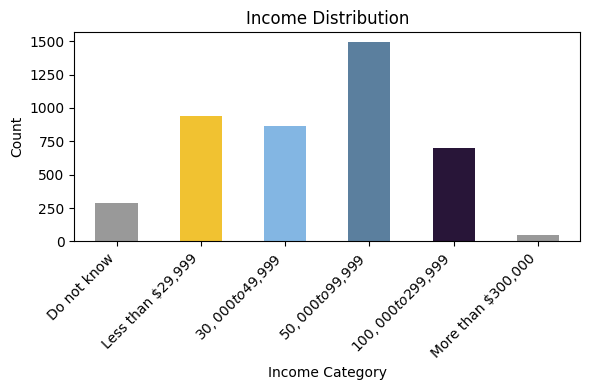

In [ ]:
index_order = ['Do not know', 'Less than $29,999', '$30,000 to $49,999',
               '$50,000 to $99,999', '$100,000 to $299,999', 'More than $300,000']

income_category_counts = df_new['Q6 annual household EBT category'].value_counts()

colors = [ '#999999',"#f1c231", "#83b6e3", '#5b7f9e','#281538']
# Reindexing the Series to match the desired order
income_category_counts_reindexed = income_category_counts.reindex(index_order)

# Plotting
plt.figure(figsize=(6, 4))
income_category_counts_reindexed.plot(kind='bar',color = colors)
plt.title('Income Distribution')
plt.xlabel('Income Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

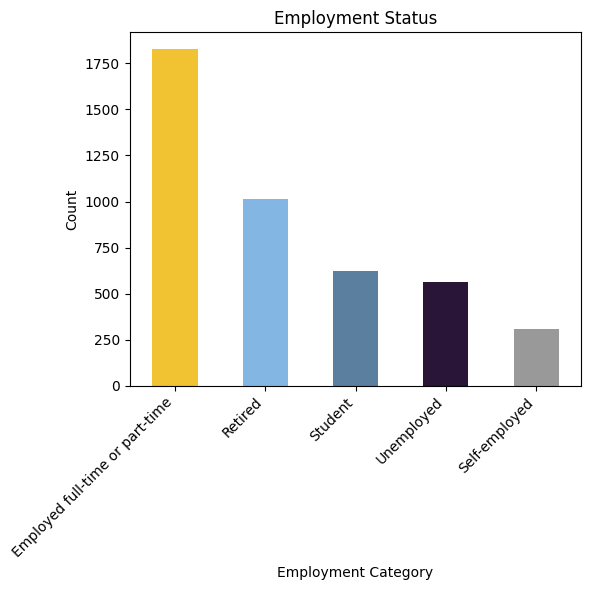

Employed full-time or part-time    1827
Retired                            1013
Student                             623
Unemployed                          564
Self-employed                       309
Name: QNEW3 employement status, dtype: int64


In [ ]:
employment_category_counts = df_new['QNEW3 employement status'].value_counts()

plt.figure(figsize=(6, 6))
colors = [ "#f1c231", "#83b6e3", '#5b7f9e','#281538','#999999']


employment_category_counts.plot(kind='bar', color=colors)
plt.title('Employment Status')
plt.xlabel('Employment Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
print(employment_category_counts)

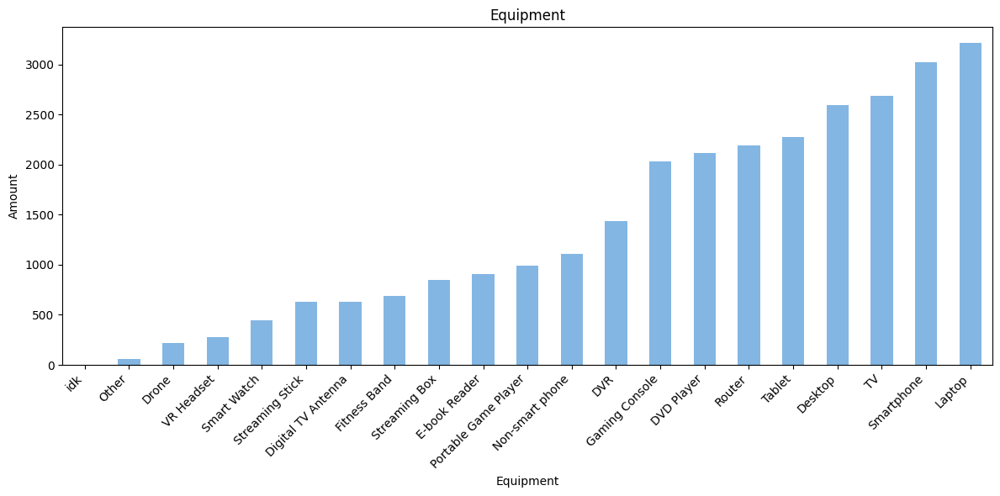

In [ ]:
q8_columns = [col for col in df_numbers.columns if col.startswith('Q8 equipment own_')]

equipment_counts_own = df_numbers[q8_columns].sum().sort_values()
equipment_counts_own.index = equipment_counts_own.index.str.replace('Q8 equipment own_', '')

# Plotting the histogram
plt.figure(figsize=(12, 6))
equipment_counts_own.plot(kind='bar',color = "#83b6e3")
plt.title('Equipment')
plt.xlabel('Equipment')
plt.ylabel('Amount')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

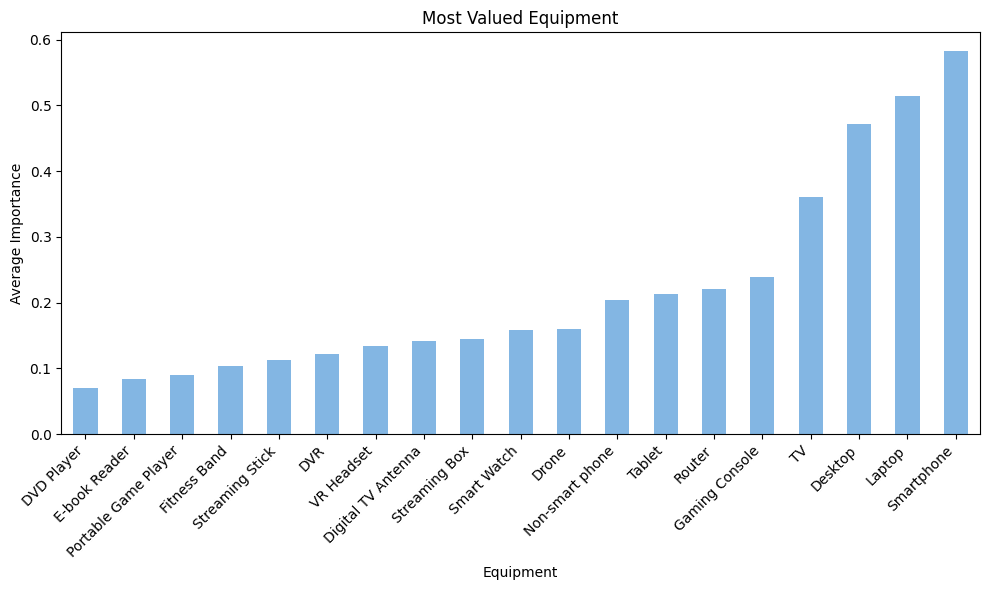

In [ ]:
q11_columns = [col for col in df_numbers.columns if col.startswith('Q11 equipment rank_')]
# Summing up the wanted equipment and sorting
equipment_rank_counts = df_numbers[q11_columns].sum().sort_values()

# Renaming the index to remove 'Q10 plan to buy_' for a cleaner plot
equipment_rank_counts.index = equipment_rank_counts.index.str.replace('Q11 equipment rank_', '')
valued_equipment_column = equipment_rank_counts/ equipment_counts_own

valued_equipment_column = valued_equipment_column.sort_values(ascending=False)

valued_equipment_column = valued_equipment_column.head(len(valued_equipment_column)-2)
valued_equipment_column = valued_equipment_column.sort_values(ascending=True)
# Plotting the histogram
plt.figure(figsize=(10,6))
valued_equipment_column.plot(kind='bar', color =  "#83b6e3")
plt.title('Most Valued Equipment')
plt.xlabel('Equipment')
plt.ylabel('Average Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

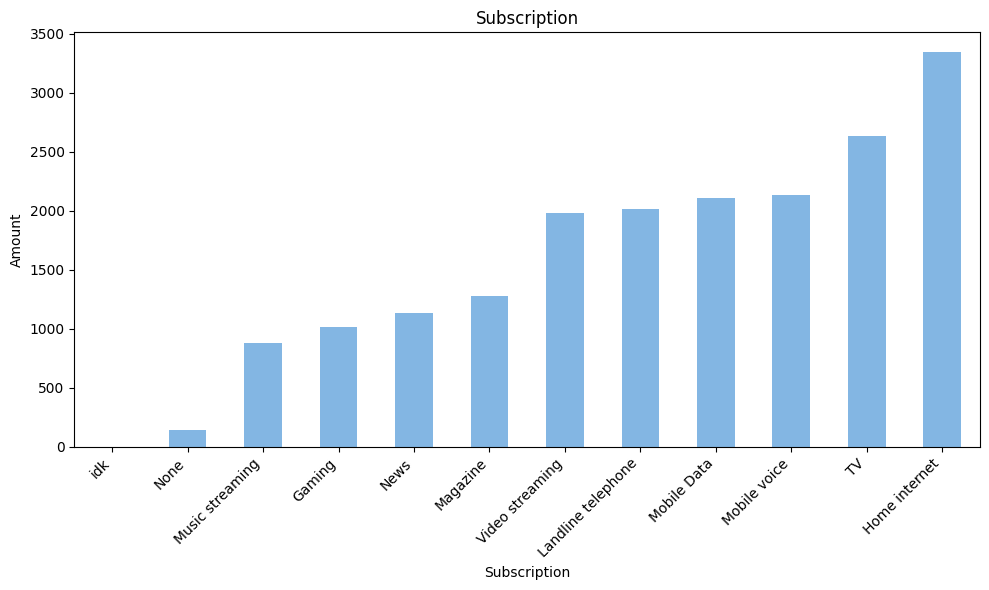

In [ ]:
q26_columns = [col for col in df_numbers.columns if col.startswith('Q26 subscription_')]

# Summing up the wanted equipment and sorting
subscription_counts = df_numbers[q26_columns].sum().sort_values()

# Renaming the index to remove 'Q10 plan to buy_' for a cleaner plot
subscription_counts.index = subscription_counts.index.str.replace('Q26 subscription_', '')


# Plotting the histogram
plt.figure(figsize=(10, 6))
subscription_counts.plot(kind='bar',color = "#83b6e3")
plt.title('Subscription')
plt.xlabel('Subscription')
plt.ylabel('Amount')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

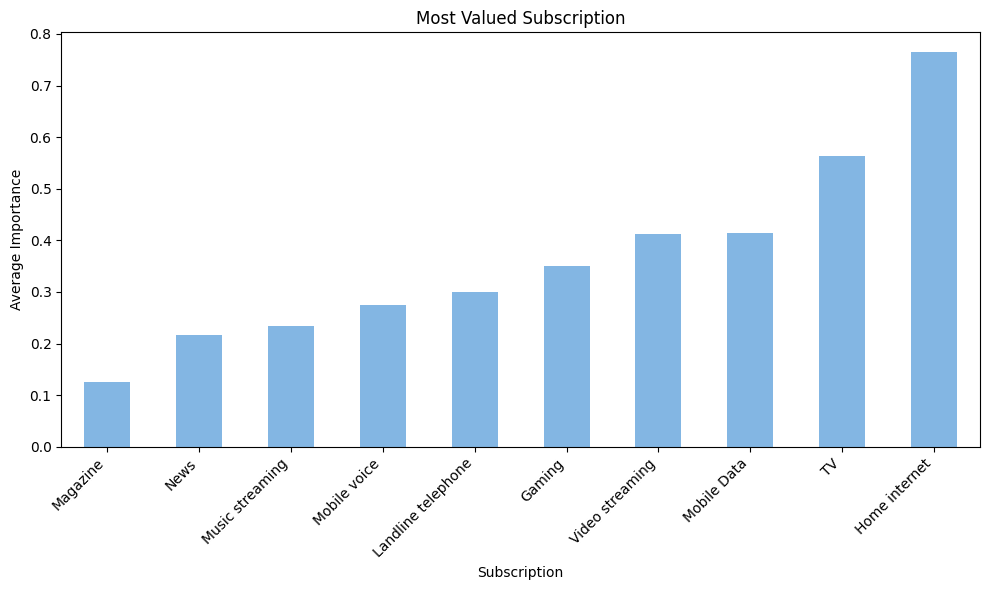

In [ ]:
q36_columns = [col for col in df_numbers.columns if col.startswith('Q36 subscription rank_')]
# Summing up the wanted equipment and sorting
subscription_rank_counts = df_numbers[q36_columns].sum().sort_values()
# Renaming the index to remove 'Q10 plan to buy_' for a cleaner plot
subscription_rank_counts.index = subscription_rank_counts.index.str.replace('Q36 subscription rank_', '')

valued_subscription_rank = subscription_rank_counts / subscription_counts
valued_subscription_rank = valued_subscription_rank[valued_subscription_rank > 0].drop(['None', 'idk'], errors='ignore')

# Sort the valued subscription rank for plotting
valued_subscription_rank_sorted = valued_subscription_rank.sort_values()


# Plotting the histogram
plt.figure(figsize=(10, 6))
valued_subscription_rank_sorted.plot(kind='bar',color = "#83b6e3")
plt.title('Most Valued Subscription')
plt.xlabel('Subscription')
plt.ylabel('Average Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

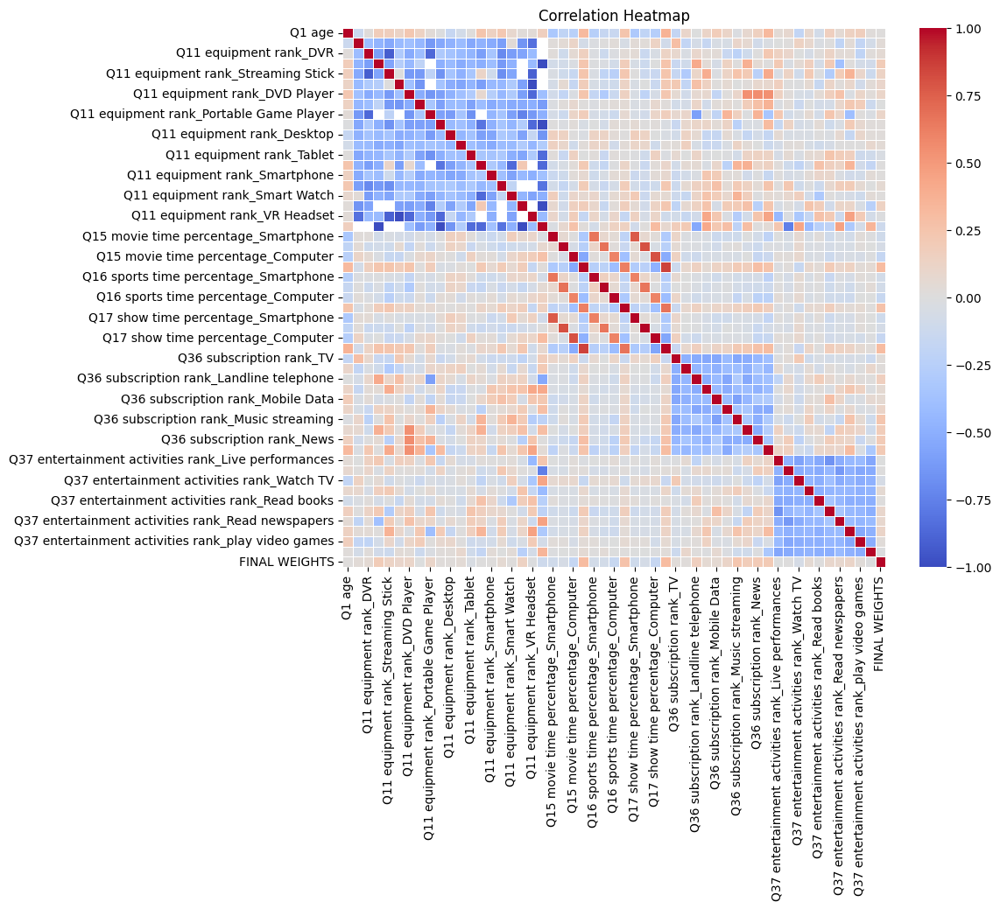

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

## Checking for outliers

In [ ]:
# Initialize lists to store column types
numeric_cols = []
binary_cols = []
categorical_cols = []

# Iterate through columns and categorize them
for column in df.columns:
    if column in ['id', 'FINAL WEIGHTS']:  # Skip these columns
        continue
    if df[column].nunique() == 2:  # Binary column
        binary_cols.append(column)
    elif df[column].dtype in ['int64', 'float64']:  # Numeric column
        numeric_cols.append(column)
    else:  # Categorical column
        categorical_cols.append(column)

# Print the lists
print("Numeric Columns:", numeric_cols)
print("Binary Columns:", binary_cols)
print("Categorical Columns:", categorical_cols)

Numeric Columns: ['Q1 age', 'Q11 equipment rank_TV', 'Q11 equipment rank_DVR', 'Q11 equipment rank_Streaming Box', 'Q11 equipment rank_Streaming Stick', 'Q11 equipment rank_Digital TV Antenna', 'Q11 equipment rank_DVD Player', 'Q11 equipment rank_Gaming Console', 'Q11 equipment rank_Portable Game Player', 'Q11 equipment rank_Router', 'Q11 equipment rank_Desktop', 'Q11 equipment rank_Laptop', 'Q11 equipment rank_Tablet', 'Q11 equipment rank_E-book Reader', 'Q11 equipment rank_Smartphone', 'Q11 equipment rank_Non-smart phone', 'Q11 equipment rank_Smart Watch', 'Q11 equipment rank_Fitness Band', 'Q11 equipment rank_VR Headset', 'Q11 equipment rank_Drone', 'Q15 movie time percentage_Smartphone', 'Q15 movie time percentage_Tablet', 'Q15 movie time percentage_Computer', 'Q15 movie time percentage_TV', 'Q16 sports time percentage_Smartphone', 'Q16 sports time percentage_Tablet', 'Q16 sports time percentage_Computer', 'Q16 sports time percentage_TV', 'Q17 show time percentage_Smartphone', 'Q17

<ipython-input-176-f734f4ee3683>:8: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



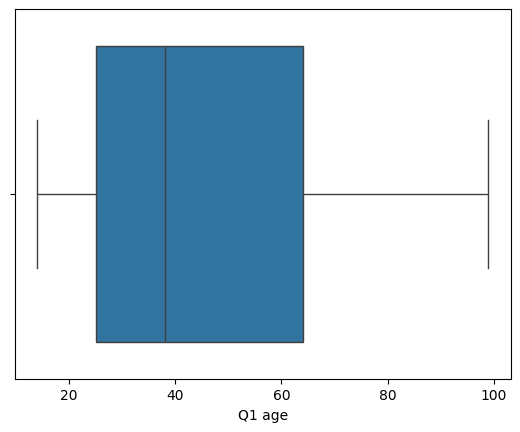

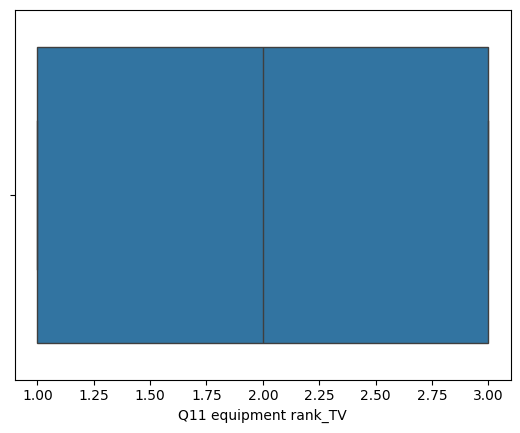

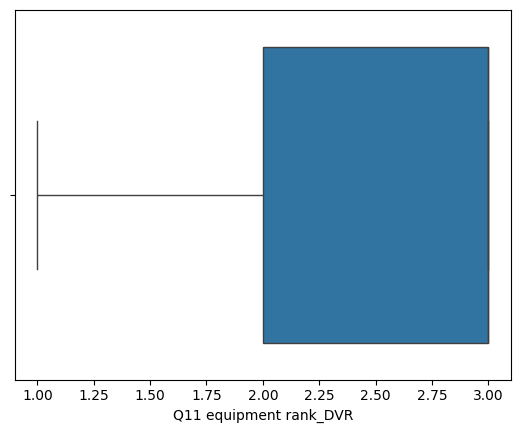

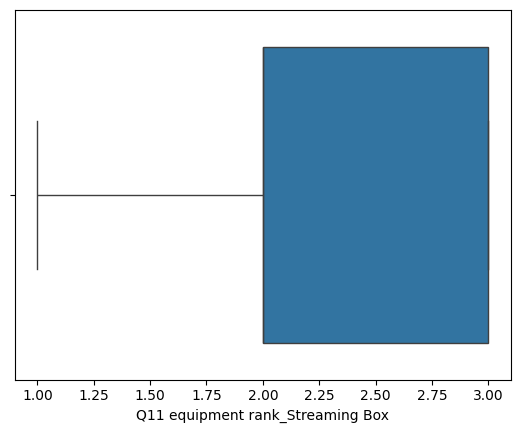

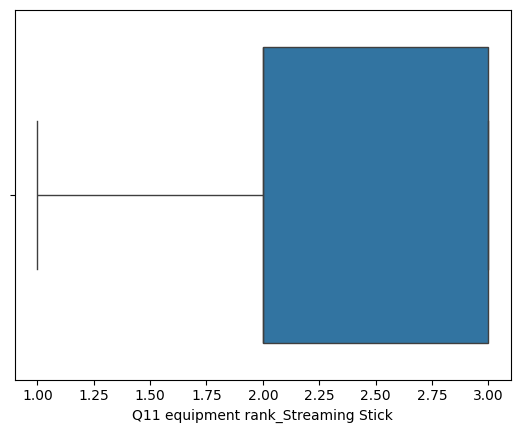

...

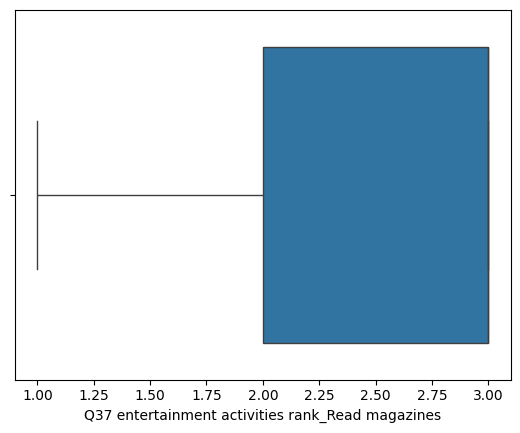

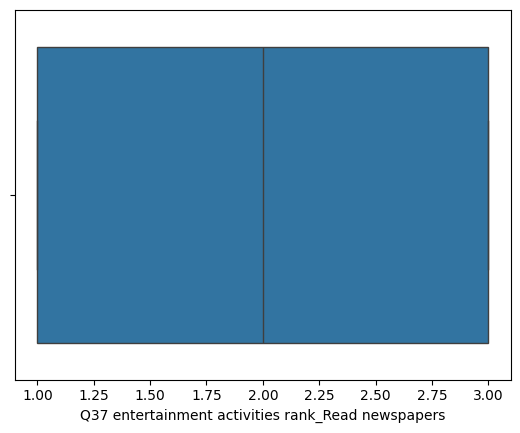

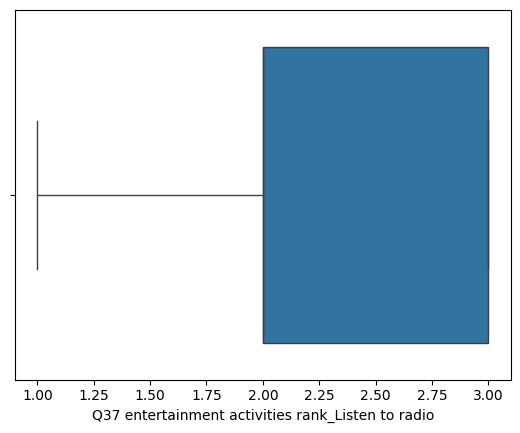

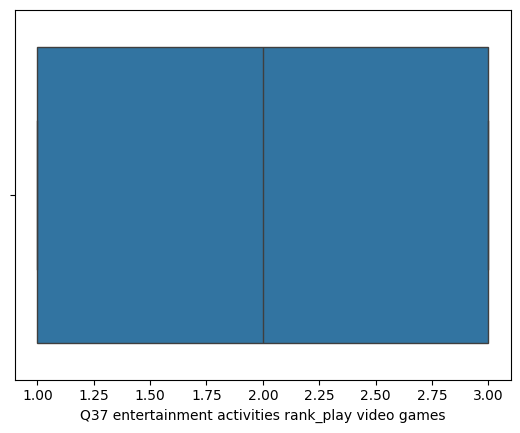

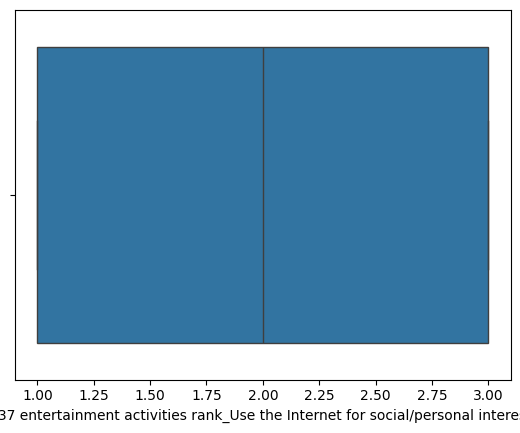

In [ ]:
# run box plot to observe numberic data
# by excluding id', 'FINAL WEIGHTS' & binary_columns & categorical_columns

for var in new_column_names:
    if var in binary_cols or var in categorical_cols or var == 'id' or var == 'FINAL WEIGHTS':
        continue
    else:
        plt.figure(var)
        sns.boxplot(x=df[var])




*   Q15 movie time percentage_Tablet seems very rightly skewed
*   Q16 sports time percentage_Smartphone, Q16 sports time percentage_Tablet seem very rightly skewed
*   Q17 show time percentage_Smartphone, Q17 show time percentage_Tablet seem very rightly skewed
*   all have 1 relatively big value (0.14):
QNEW 19 movie methods frequency_Rent disc, QNEW 19 movie methods frequency_Buy disc, QNEW 19 movie methods frequency_Buy digital resource, QNEW 19 movie methods frequency_Rent digital resource, QNEW 19 movie methods frequency_TV service provider
QNEW20 series questions also have same issue.





In [ ]:
# Closing all the figures to save memory
for var in new_column_names:
    if var in var in binary_cols or var in categorical_cols or var == 'id' or var == 'FINAL WEIGHTS':
        continue
    else:
        plt.close(var)

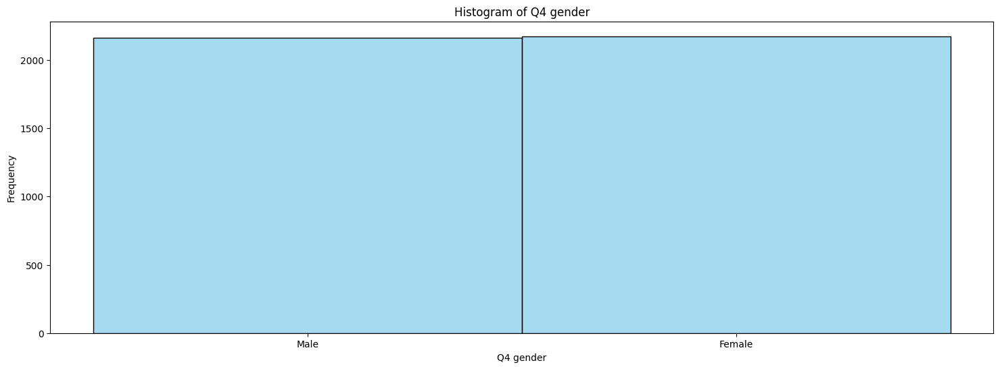

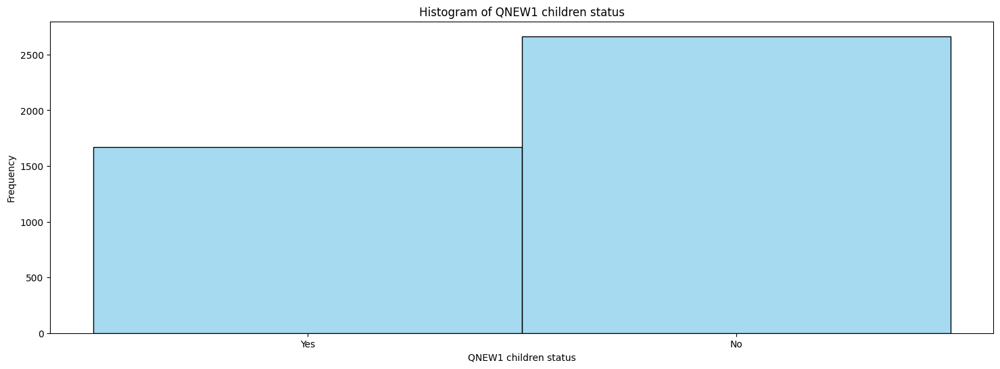

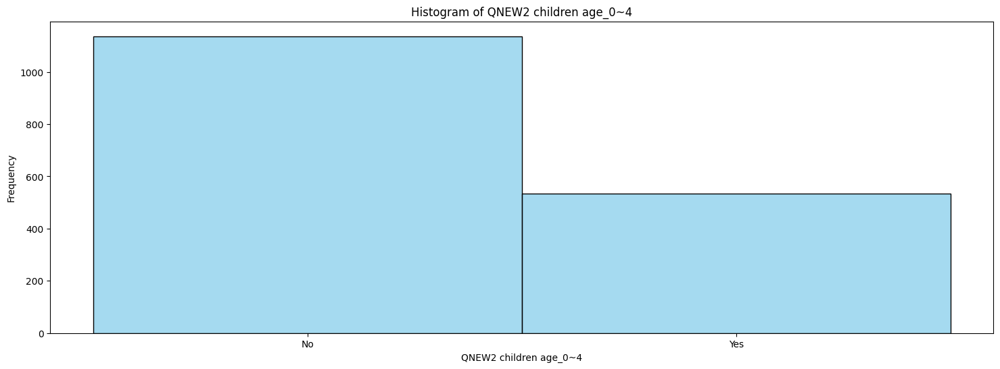

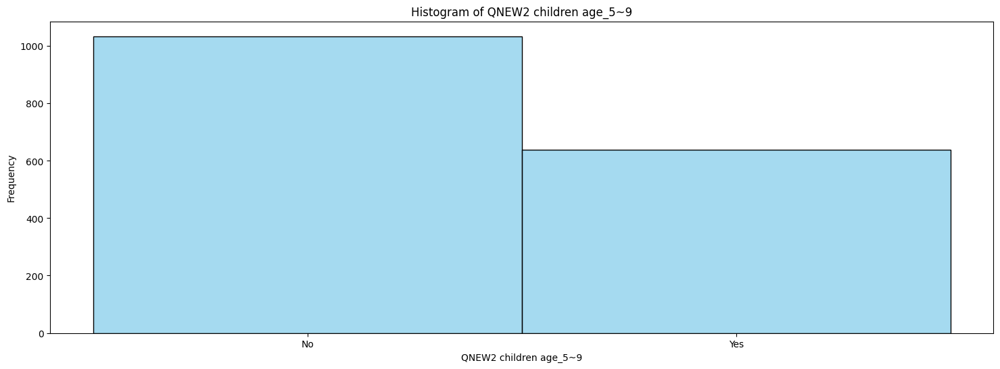

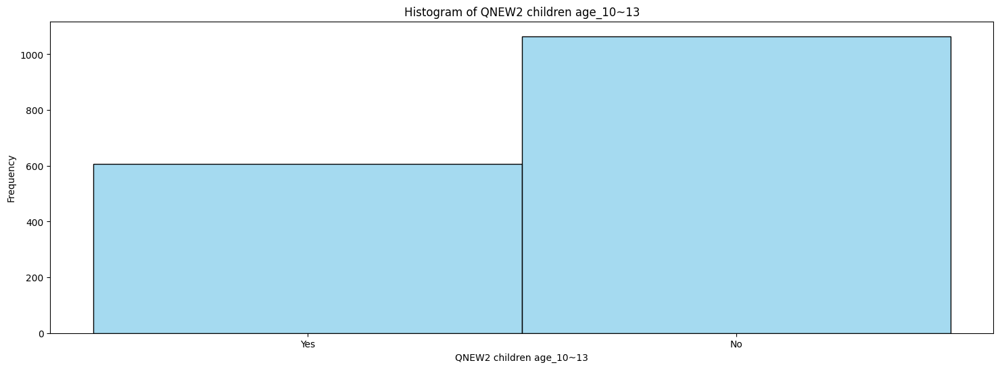

...

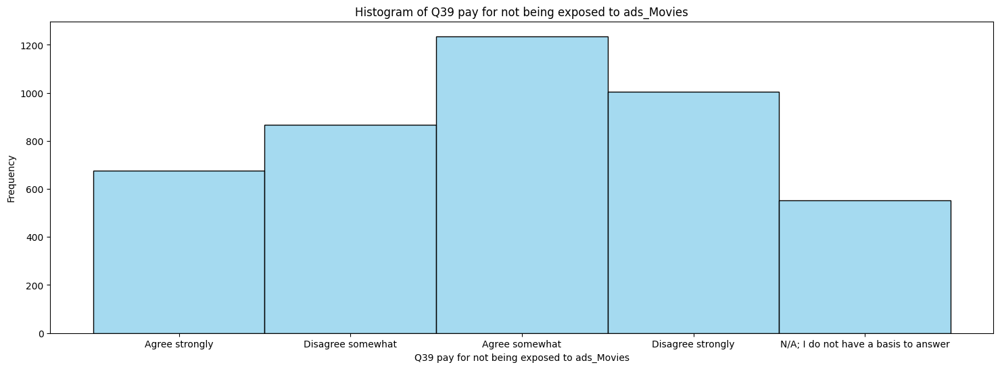

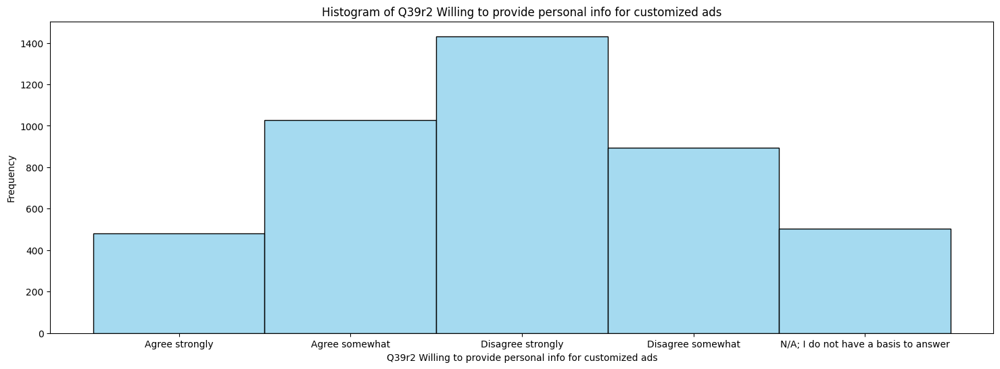

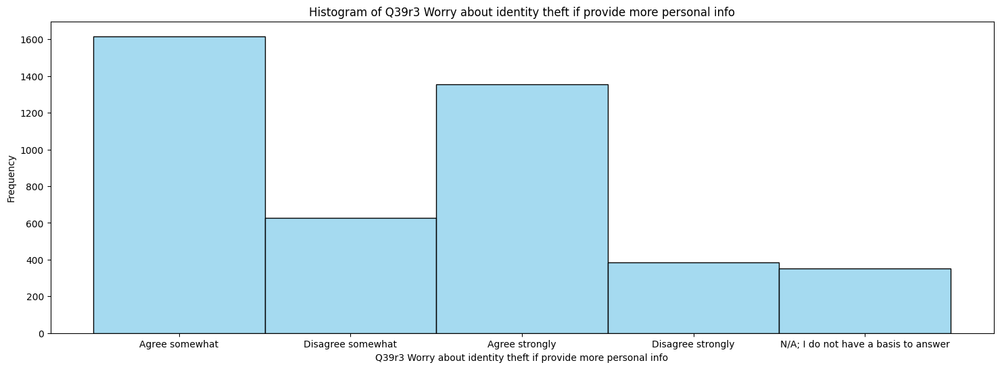

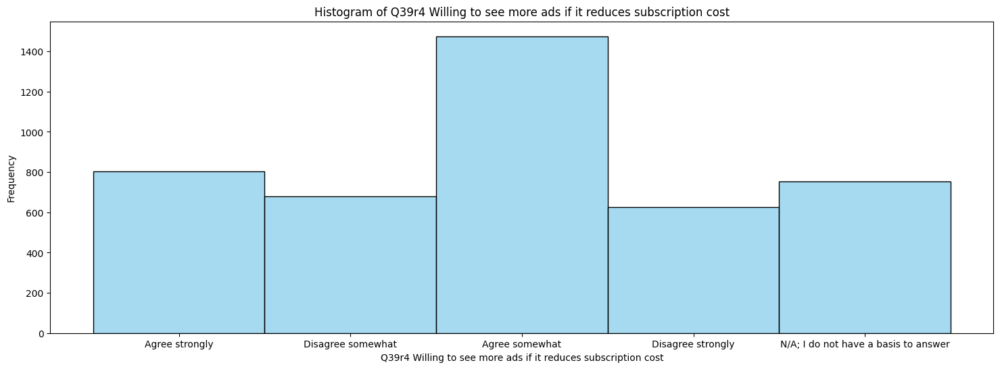

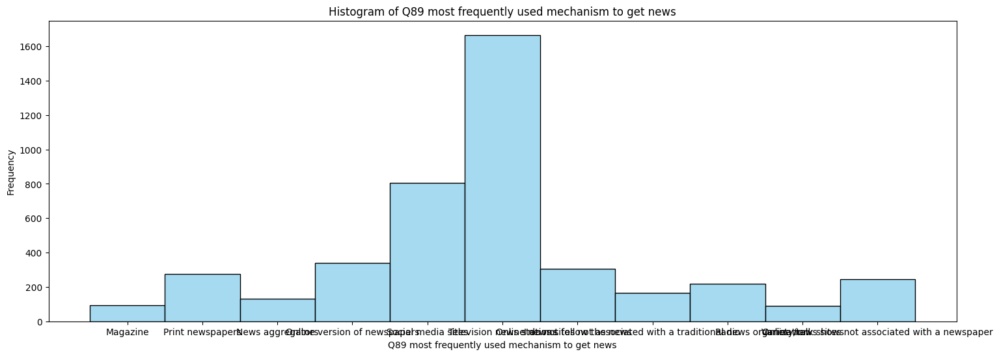

In [ ]:
# Run histograms to observe the binary variables, categorical variables and viewer_status

# Combine all categorical columns including viewer_status
categorical_cols_all = categorical_cols

# Plot histograms for binary, categorical, and viewer_status columns

for col in binary_cols + categorical_cols_all:
    plt.figure(figsize=(18, 6))
    sns.histplot(data=df, x=col, kde=False, color='skyblue')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Clustering
### PCA

In [ ]:
df_train = df_numbers.copy()
df_train.drop(columns=['FINAL WEIGHTS'], inplace=True)
df_train.drop(columns=object_columns, inplace=True)

In [ ]:
df_train['Q1 age'] = df_train['Q1 age'] / df_train['Q1 age'].max()

In [ ]:
# Definging threshold to remove collinearity
def remove_collinear_features(x, threshold):
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                #print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)
    print('Removed Columns {}'.format(drops))
    return x

df_train = remove_collinear_features(df_train, 0.8)
df_train

Removed Columns {'Q17 show time percentage_Computer', 'Q17 show time percentage_TV', 'Q17 show time percentage_Tablet', 'Q73 multitask when watching TV_Purchase products online'}


,Q1 age,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscription_Magazine,Q26 subscription_None,Q26 subscription_idk,Q36 subscription rank_TV,Q36 subscription rank_Home internet,Q36 subscription rank_Landline telephone,Q36 subscription rank_Mobile voice,Q36 subscription ran

#### We now have a new DataFrame called **df_train**, which has fewer columns than **df_numbers**

In [ ]:
# Making a DataFrame of only the scaled features
from sklearn.decomposition import PCA
pca = PCA()

scaled_features = pd.DataFrame()

scaled_features = pd.concat([df_train], axis=1)

pca.fit(scaled_features)

PCA()

Text(0, 0.5, 'Cumulative Explained Variance Ratio')

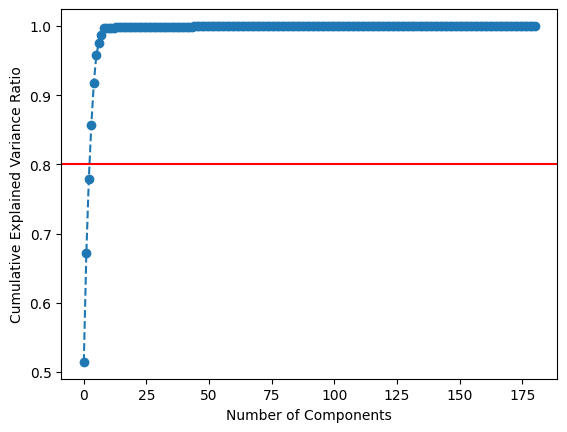

In [ ]:
plt.figure()
plt.plot(pca.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')
plt.axhline(0.8, color='red')

# Label the x-axis
plt.xlabel('Number of Components')

# Label the y-axis
plt.ylabel('Cumulative Explained Variance Ratio')

# Hence around 4 components explain 80% of the variation.

In [ ]:
# n = 4 explains 80% of the variation, so we will use 3 components
pca = PCA(n_components = 4)
pca.fit(scaled_features)

PCA(n_components=4)

In [ ]:
scores_pca = pca.transform(scaled_features)
scores_pca

array([[ 99.06425142, -74.79714892, -13.81692796,  14.05548515],
       [ 64.76789224,  32.85777057,  32.57028826,  10.65947495],
       [ 99.06471262, -74.79838719, -13.8181857 ,  14.05537465],
       ...,
       [ 70.79821898, -22.20691408, -16.48929554, -24.51152844],
       [-29.34209064,  31.27466931, -57.87031136,  25.62035636],
       [-29.43435524,  31.06889197, -58.27696066,  25.21059409]])

Text(0, 0.5, 'WCSS')

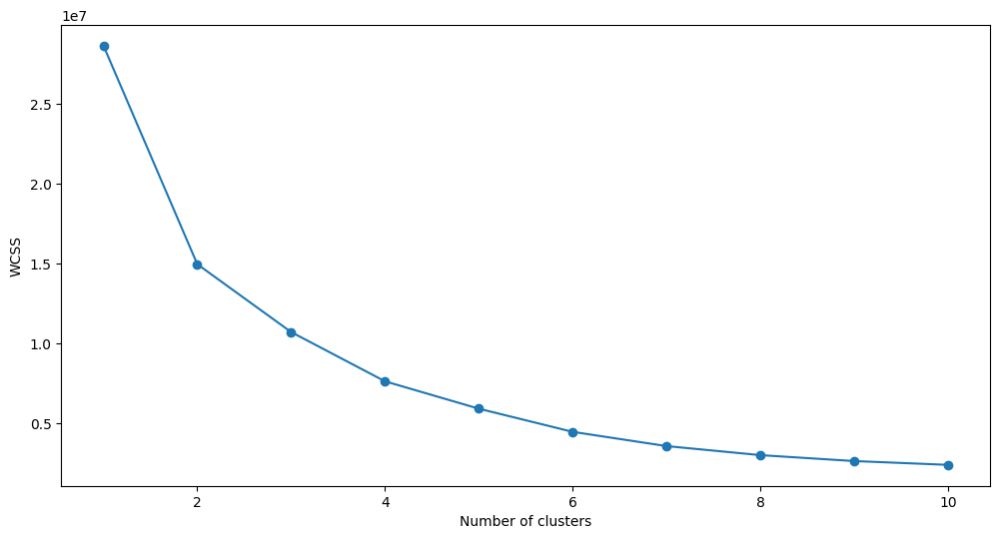

In [ ]:
from sklearn.cluster import KMeans
# Checking for up to 11 clusters
wcss = [] #Within-cluster sum of squares

for i in range(1,11):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', n_init=10, random_state = 42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

# Deciding on the number of clusters using elbow method

plt.figure(figsize=(12,6))
plt.plot(range(1,11), wcss, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

#### Key Metrics

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters = 2 The average silhouette_score is : 0.45456685760121424


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters = 3 The average silhouette_score is : 0.44841074713871815


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



For n_clusters = 4 The average silhouette_score is : 0.5011900530673641


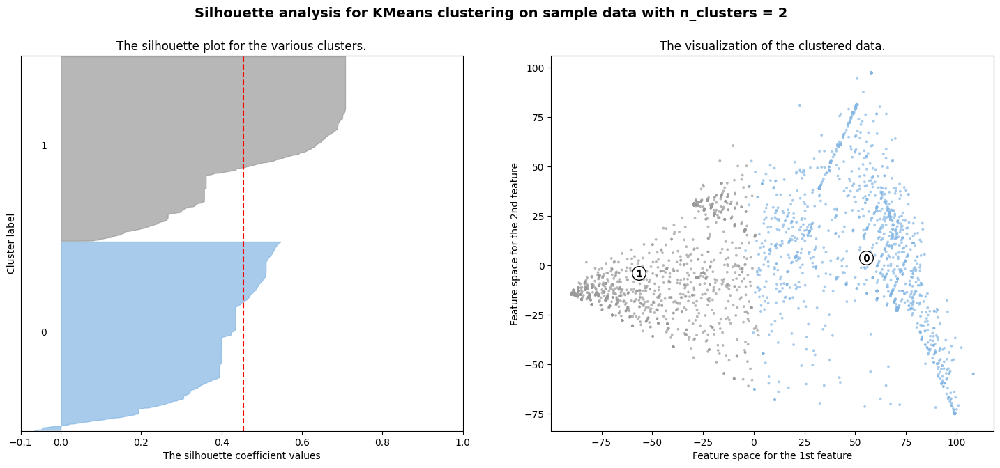

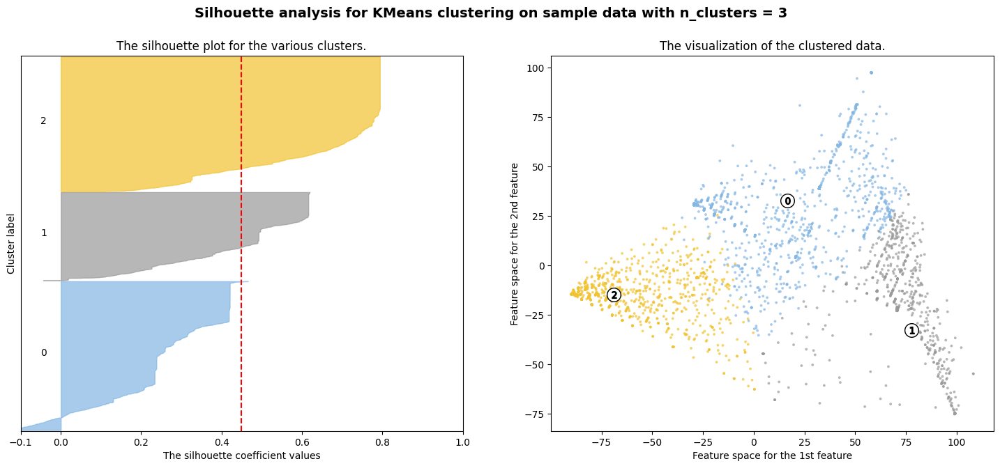

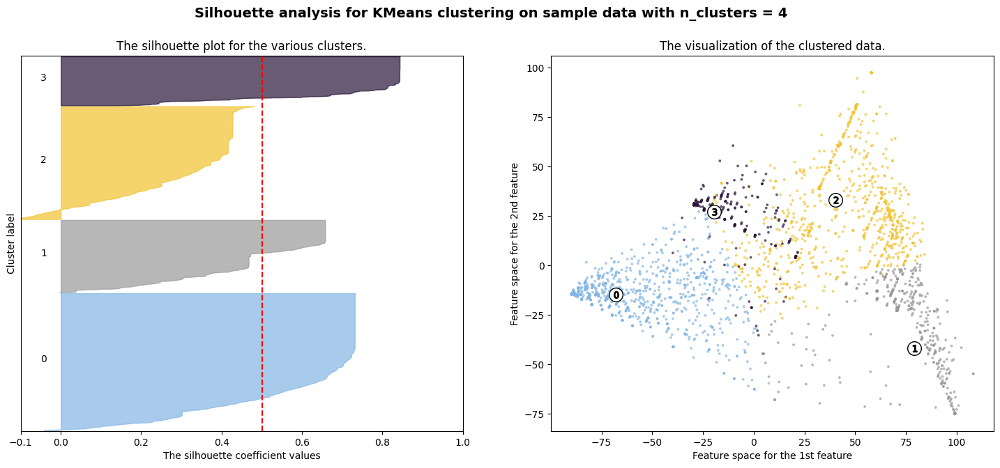

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

color_dict = {0: '#83B6E3', 1: '#999999', 2: '#f1c231', 3: '#281538'}

range_n_clusters = [2, 3, 4]
X = scores_pca

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        #color = cm.nipy_spectral(float(i) / n_clusters)
        color = color_dict[i]
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=[color_dict[label] for label in cluster_labels], edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()
# score = silhouette_score(df_train, clusters)
# print("Silhouette Score: ", score)

Davies-Bouldin Index for n_clusters = 2 : 1.1057547080087589
Davies-Bouldin Index for n_clusters = 3 : 1.2894925672294193
Davies-Bouldin Index for n_clusters = 4 : 1.1414008773179904


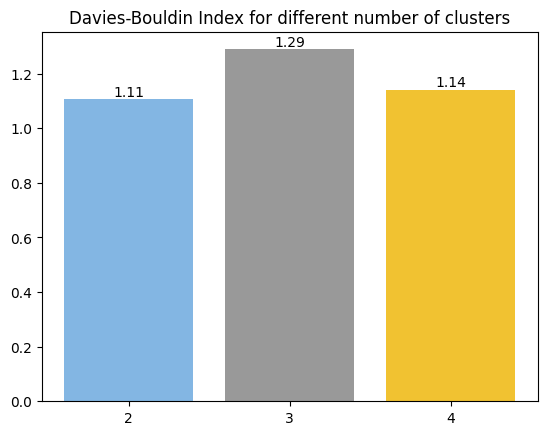

In [ ]:
from sklearn.metrics import davies_bouldin_score
import matplotlib.ticker as ticker

dbis = []
for k in range(2,5):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    clusters = kmeans.fit_predict(df_train)
    dbi = davies_bouldin_score(df_train, clusters)
    print("Davies-Bouldin Index for n_clusters =", k, ":", dbi)
    dbis.append(dbi)
bars = plt.bar([2,3,4], dbis, color = color_dict.values())
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.title('Davies-Bouldin Index for different number of clusters')
plt.show()

Carlinski-Harabasz score for n_clusters = 2 : 3014.876801098868
Carlinski-Harabasz score for n_clusters = 3 : 2527.969145669453
Carlinski-Harabasz score for n_clusters = 4 : 2483.4718680483065


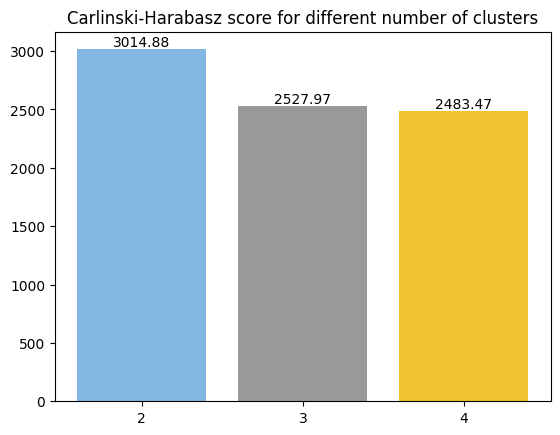

In [ ]:
from sklearn.metrics import calinski_harabasz_score

ch_scores = []
for k in range(2,5):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    clusters = kmeans.fit_predict(df_train)
    ch = calinski_harabasz_score(df_train, clusters)
    print("Carlinski-Harabasz score for n_clusters =", k, ":", ch)
    ch_scores.append(ch)
bars = plt.bar([2,3,4], ch_scores, color = color_dict.values())
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')
ax = plt.gca()
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.title('Carlinski-Harabasz score for different number of clusters')
plt.show()

<ipython-input-190-12474a738c2a>:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Text(0, 0.5, 'movie time percentage_TV')

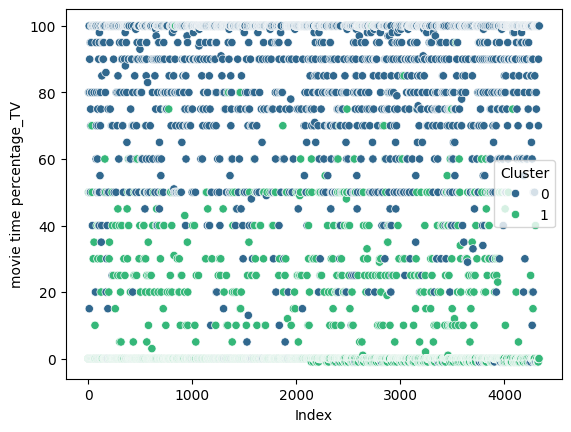

In [ ]:
# Based on the evaluation metrices, we will use 2 clusters
k = 2

# train kmeans model
kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
clusters = kmeans.fit_predict(df_numbers[numeric_columns])

# add cluster result to dataframe
df_numbers['Cluster'] = clusters
df['Cluster'] = clusters
df_new['Cluster'] = clusters

# Now drawing the clusters against top 5 features found below
sns.scatterplot(data = df, x = df.index, y = 'Q15 movie time percentage_TV', hue = 'Cluster', palette = 'viridis')

plt.xlabel('Index')
plt.ylabel('movie time percentage_TV')

Text(0, 0.5, 'age')

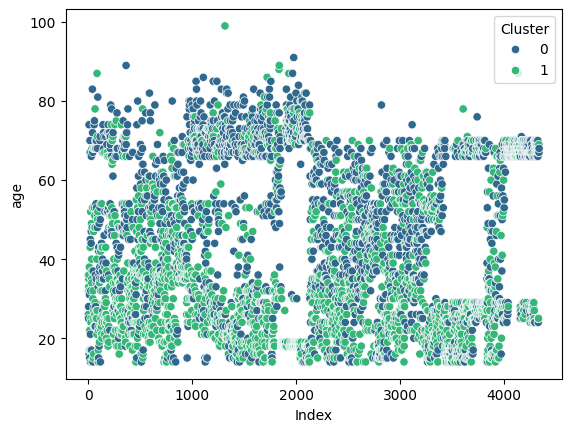

In [ ]:
sns.scatterplot(data = df, x = df.index, y = 'Q1 age', hue = 'Cluster', palette = 'viridis')
plt.xlabel('Index')
plt.ylabel('age')

Text(0, 0.5, 'sports time percentage_TV')

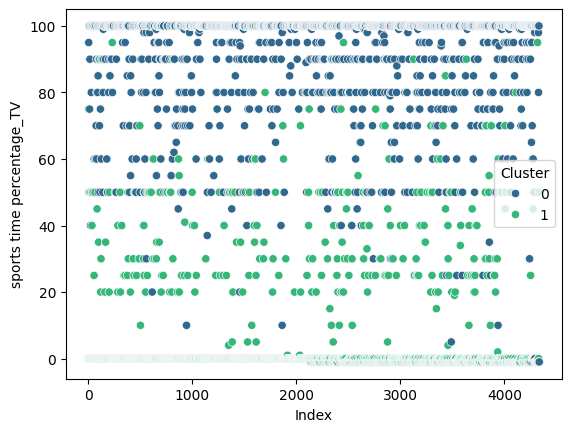

In [ ]:
sns.scatterplot(data = df, x = df.index, y = 'Q16 sports time percentage_TV', hue = 'Cluster', palette = 'viridis')
plt.xlabel('Index')
plt.ylabel('sports time percentage_TV')

Text(0, 0.5, 'movie time percentage_Computer')

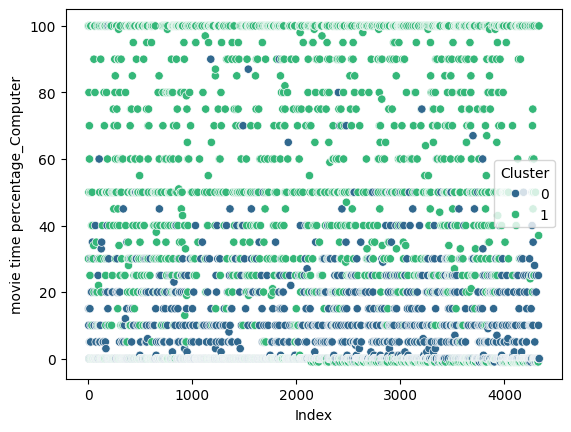

In [ ]:
sns.scatterplot(data = df, x = df.index, y = 'Q15 movie time percentage_Computer', hue = 'Cluster', palette = 'viridis')
plt.xlabel('Index')
plt.ylabel('movie time percentage_Computer')

Text(0, 0.5, 'sports time percentage_Computer')

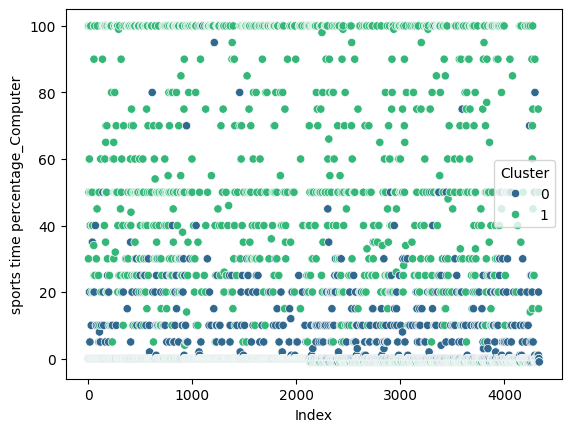

In [ ]:
sns.scatterplot(data = df, x = df.index, y = 'Q16 sports time percentage_Computer', hue = 'Cluster', palette = 'viridis')
plt.xlabel('Index')
plt.ylabel('sports time percentage_Computer')

- results on PCA

<Axes: xlabel='PC1', ylabel='PC2'>

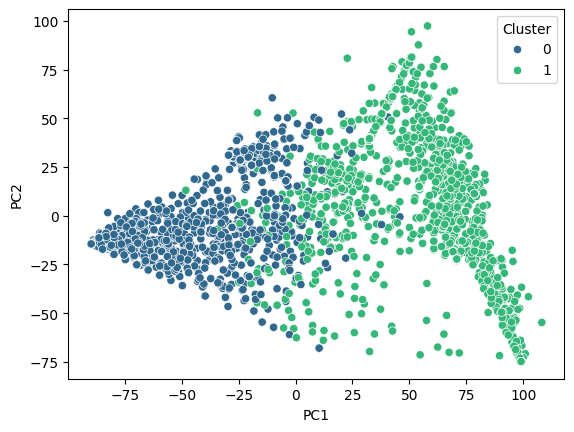

In [ ]:
scores_pca = pd.DataFrame(scores_pca, columns = ['PC1', 'PC2', 'PC3', 'PC4'])
sns.scatterplot(data = scores_pca, x = 'PC1', y = 'PC2', hue = df_numbers['Cluster'], palette = 'viridis')

In [ ]:
#PCA visualization
import plotly.express as px

fig = px.scatter_3d(scores_pca, x='PC1', y='PC2', z='PC3', color=clusters)

fig.show()

### Try to interpret the clusters

In [ ]:
cluster_means = df_numbers.groupby('Cluster').mean()

<ipython-input-197-f120fe2938bb>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [ ]:
numeric_columns

['Q1 age',
 'QNEW1 children status',
 'QNEW2 children age_0~4',
 'QNEW2 children age_5~9',
 'QNEW2 children age_10~13',
 'QNEW2 children age_14~18',
 'QNEW2 children age_19~25',
 'QNEW2 children age_26+',
 'QNEW2 children age_idk',
 'Q8 equipment own_TV',
 'Q8 equipment own_DVR',
 'Q8 equipment own_Streaming Box',
 'Q8 equipment own_Streaming Stick',
 'Q8 equipment own_Digital TV Antenna',
 'Q8 equipment own_DVD Player',
 'Q8 equipment own_Gaming Console',
 'Q8 equipment own_Portable Game Player',
 'Q8 equipment own_Router',
 'Q8 equipment own_Desktop',
 'Q8 equipment own_Laptop',
 'Q8 equipment own_Tablet',
 'Q8 equipment own_E-book Reader',
 'Q8 equipment own_Smartphone',
 'Q8 equipment own_Non-smart phone',
 'Q8 equipment own_Smart Watch',
 'Q8 equipment own_Fitness Band',
 'Q8 equipment own_VR Headset',
 'Q8 equipment own_Drone',
 'Q8 equipment own_Other',
 'Q8 equipment own_idk',
 'Q10 plan to buy_TV',
 'Q10 plan to buy_DVR',
 'Q10 plan to buy_Streaming Box',
 'Q10 plan to buy_Str

In [ ]:
cluster_centers = kmeans.cluster_centers_


# see the centers to get an idea of the clusters
df_centers = pd.DataFrame(cluster_centers, columns=numeric_columns)
df_centers

,Q1 age,QNEW1 children status,QNEW2 children age_0~4,QNEW2 children age_5~9,QNEW2 children age_10~13,QNEW2 children age_14~18,QNEW2 children age_19~25,QNEW2 children age_26+,QNEW2 children age_idk,Q8 equipment own_TV,Q8 equipment own_DVR,Q8 equipment own_Streaming Box,Q8 equipment own_Streaming Stick,Q8 equipment own_Digital TV Antenna,Q8 equipment own_DVD Player,Q8 equipment own_Gaming Console,Q8 equipment own_Portable Game Player,Q8 equipment own_Router,Q8 equipment own_Desktop,Q8 equipment own_Laptop,Q8 equipment own_Tablet,Q8 equipment own_E-book Reader,Q8 equipment own_Smartphone,Q8 equipment own_Non-smart phone,Q8 equipment own_Smart Watch,Q8 equipment own_Fitness Band,Q8 equipment own_VR Headset,Q8 equipment own_Drone,Q8 equipment own_Other,Q8 equipment own_idk,Q10 plan to buy_TV,Q10 plan to buy_DVR,Q10 plan to buy_Streaming Box,Q10 plan to buy_Streaming Stick,Q10 plan to buy_Digital TV Antenna,Q10 plan to buy_DVD Player,Q10 plan to buy_Gaming Console,Q10 plan to buy_Portable Game Player,Q10 plan to buy_Router,Q10 plan to buy_Desktop,Q10 plan to buy_Laptop,Q10 plan to buy_Tablet,Q10 plan to buy_E-book Reader,Q10 plan to buy_Smartphone,Q10 plan to buy_Non-smart phone,Q10 plan to buy_Smart Watch,Q10 plan to buy_Fitness Band,Q10 plan to buy_VR Headset,Q10 plan to buy_Drone,Q10 plan to buy_Other,Q10 plan to buy_idk,Q11 equipment rank_TV,Q11 equipment rank_DVR,Q11 equipment rank_Streaming Box,Q11 equipment rank_Streaming Stick,Q11 equipment rank_Digital TV Antenna,Q11 equipment rank_DVD Player,Q11 equipment rank_Gaming Console,Q11 equipment rank_Portable Game Player,Q11 equipment rank_Router,Q11 equipment rank_Desktop,Q11 equipment rank_Laptop,Q11 equipment rank_Tablet,Q11 equipment rank_E-book Reader,Q11 equipment rank_Smartphone,Q11 equipment rank_Non-smart phone,Q11 equipment rank_Smart Watch,Q11 equipment rank_Fitness Band,Q11 equipment rank_VR Headset,Q11 equipment rank_Drone,Q15 movie time percentage_Smartphone,Q15 movie time percentage_Tablet,Q15 movie time percentage_Computer,Q15 movie time percentage_TV,Q16 sports time percentage_Smartphone,Q16 sports time percentage_Tablet,Q16 sports time percentage_Computer,Q16 sports time percentage_TV,Q17 show time percentage_Smartphone,Q17 show time percentage_Tablet,Q17 show time percentage_Computer,Q17 show time percentage_TV,Q22 app used frequently_Photo/video,Q22 app used frequently_Banking,Q22 app used frequently_Fitness/health,Q22 app used frequently_Food/drink,Q22 app used frequently_Retail/shopping,Q22 app used frequently_Navigation,Q22 app used frequently_Social media,Q22 app used frequently_Reading,Q22 app used frequently_Music Streaming,Q22 app used frequently_Video Streaming,Q22 app used frequently_Reviews/Guides,Q22 app used frequently_News Consolidator,Q22 app used frequently_Newspaper/broadcaster,Q22 app used frequently_Magazines,Q22 app used frequently_Diagnostics/utilities,Q22 app used frequently_QR Scan,Q22 app used frequently_Travel,Q22 app used frequently_Transportation,Q22 app used frequently_Location,Q22 app used frequently_Language,Q22 app used frequently_Movie,Q22 app used frequently_Business,Q22 app used frequently_Games,Q22 app used frequently_Productivity,Q22 app used frequently_Sports,Q22 app used frequently_Weather,Q22 app used frequently_Browser,Q22 app used frequently_VOIP,Q22 app used frequently_Dating,Q22 app used frequently_Messaging,Q22 app used frequently_Mobile Payment,Q22 app used frequently_Education,Q22 app used frequently_Tickets,Q22 app used frequently_Reservations,Q22 app used frequently_Hobby,Q22 app used frequently_Not any,Q22 app used frequently_idk,Q26 subscription_TV,Q26 subscription_Home internet,Q26 subscription_Landline telephone,Q26 subscription_Mobile voice,Q26 subscription_Mobile Data,Q26 subscription_Video streaming,Q26 subscription_Music streaming,Q26 subscription_Gaming,Q26 subscription_News,Q26 subscription_Magazine,Q26 subscription_None,Q26 subscription_idk,Q36 subscription rank_TV,Q36 subscription rank_Home internet,Q3

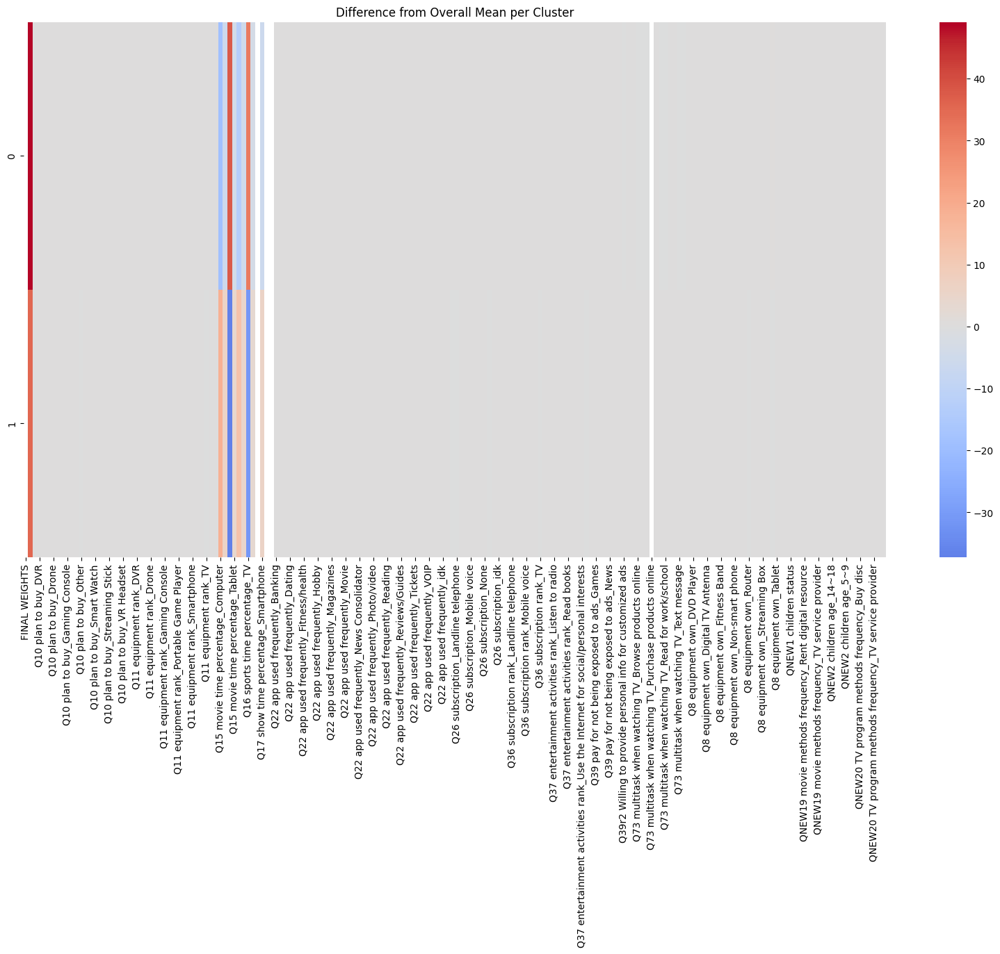

In [ ]:
# Calculate the overall mean for each feature
overall_means = df_train.mean()

# Calculate the difference between each cluster's centroid and the overall mean
centroid_diffs = df_centers - overall_means

# Visualize the differences using a heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(centroid_diffs, annot=False, cmap='coolwarm', center=0)
plt.title('Difference from Overall Mean per Cluster')
plt.xticks(rotation=90)
plt.show()

In [ ]:
top_features_per_cluster = centroid_diffs.abs().apply(lambda s: s.nlargest(5).index.tolist(), axis=1)
print("Top 5 features for each cluster based on the largest mean differences from the overall mean:")
for cluster_num, features in top_features_per_cluster.items():
    print(f"Cluster {cluster_num}: {', '.join(features)}")

Top 5 features for each cluster based on the largest mean differences from the overall mean:
Cluster 0: Q1 age, Q15 movie time percentage_TV, Q16 sports time percentage_TV, Q15 movie time percentage_Computer, Q16 sports time percentage_Computer
Cluster 1: Q15 movie time percentage_TV, Q1 age, Q16 sports time percentage_TV, Q15 movie time percentage_Computer, Q16 sports time percentage_Computer


### Show some group difference

In [ ]:
order = ['Less than $29,999', '$30,000 to $49,999', '$50,000 to $99,999', '$100,000 to $299,999', 'More than $300,000', 'Do not know']
df_young = df.loc[df['Cluster'] == 1]

# df_young['Q6 annual household EBT category'].replace({'Less than $29,999': 14500, '$30,000 to $49,999': 40000, '$50,000 to $99,999': 75000, '$100,000 to $299,999': 200000, 'More than $300,000': 300000, 'Do not know': 0}, inplace=True)
# df_young['Q6 annual household EBT category'] = df_young['Q6 annual household EBT category'].astype(int)
# average_young = df_young['Q6 annual household EBT category'].replace(0,np.NaN).mean()
# average_young

# show histogram of the income category
#plt.figure(figsize=(20, 5))
#df_young['Q6 annual household EBT category'].hist()
#plt.ylim(0, 1000)
#plt.show()

df_young['QNEW3 employement status'].value_counts() #289 / 2176

Employed full-time or part-time    1010
Student                             420
Unemployed                          292
Retired                             289
Self-employed                       165
Name: QNEW3 employement status, dtype: int64

In [ ]:
df_old = df.loc[df['Cluster'] == 0]

# df_old['Q6 annual household EBT category'].replace({'Less than $29,999': 14500, '$30,000 to $49,999': 40000, '$50,000 to $99,999': 75000, '$100,000 to $299,999': 200000, 'More than $300,000': 300000, 'Do not know': 0}, inplace=True)
# df_old['Q6 annual household EBT category'] = df_old['Q6 annual household EBT category'].astype(int)
# average_old = df_old['Q6 annual household EBT category'].replace(0,np.NaN).mean()
# average_old

# show histogram of the income category
#plt.figure(figsize=(20, 5))
#df_old['Q6 annual household EBT category'].hist()
#plt.ylim(0, 1000)
#plt.show()
df_old['QNEW3 employement status'].value_counts() #724 / 2160

Employed full-time or part-time    817
Retired                            724
Unemployed                         272
Student                            203
Self-employed                      144
Name: QNEW3 employement status, dtype: int64

- Employement status

In [ ]:
df['QNEW3 employement status'].value_counts()

Employed full-time or part-time    1827
Retired                            1013
Student                             623
Unemployed                          564
Self-employed                       309
Name: QNEW3 employement status, dtype: int64

Feature importance

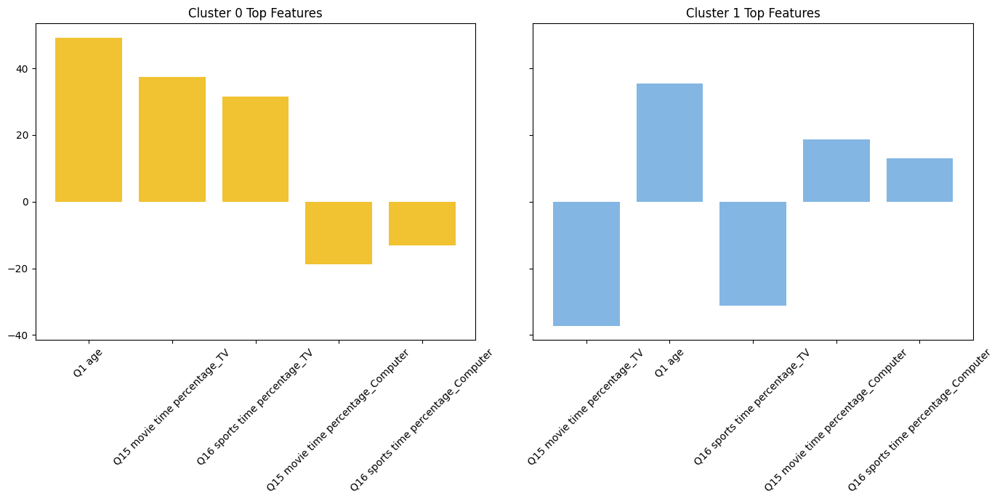

In [ ]:
# Define colors for each cluster
colors = ['#f1c231', '#83B6E3']

# Plotting the top 5 features for each cluster
fig, axes = plt.subplots(1, len(top_features_per_cluster), figsize=(14, 7), sharey=True)

for i, (cluster_num, features) in enumerate(top_features_per_cluster.items()):
    # Select the top features for the cluster
    top_values = centroid_diffs.loc[cluster_num, features]
    # Use the same color for each cluster
    axes[i].bar(features, top_values, color=colors[i % len(colors)])
    axes[i].set_title(f'Cluster {cluster_num} Top Features')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Insights Generation

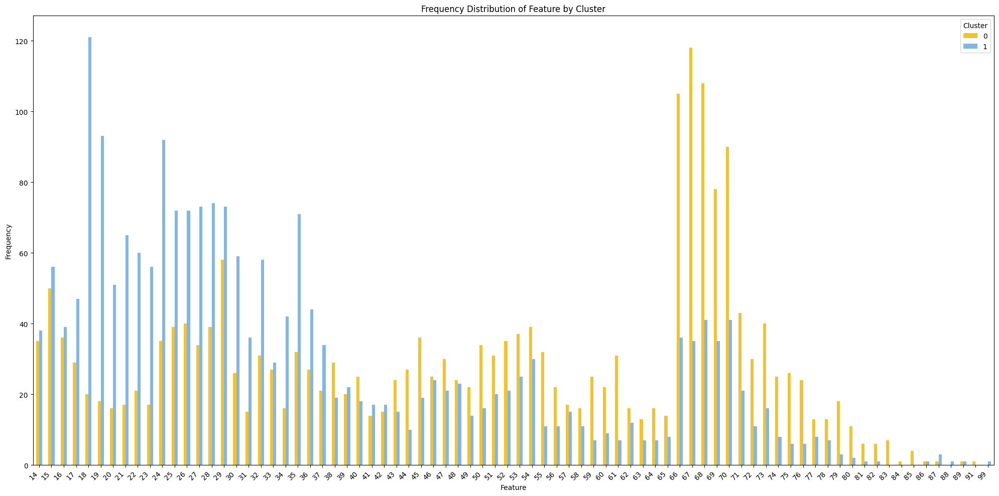

In [ ]:
#frequency distribution for Age
frequency_distribution = df_numbers.groupby(['Cluster', 'Q1 age']).size().reset_index(name='count')

# Pivot the data for plotting
pivot_df = frequency_distribution.pivot(index='Q1 age', columns='Cluster', values='count').fillna(0)

# Plot
pivot_df.plot(kind='bar', figsize=(20, 10),color=['#f1c231', '#83B6E3'])

# Add titles and labels
plt.title('Frequency Distribution of Feature by Cluster')
plt.xlabel('Feature')
plt.ylabel('Frequency')
# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')  #Rotate the labels and align them horizontally to the right

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

Bar charts based on important features

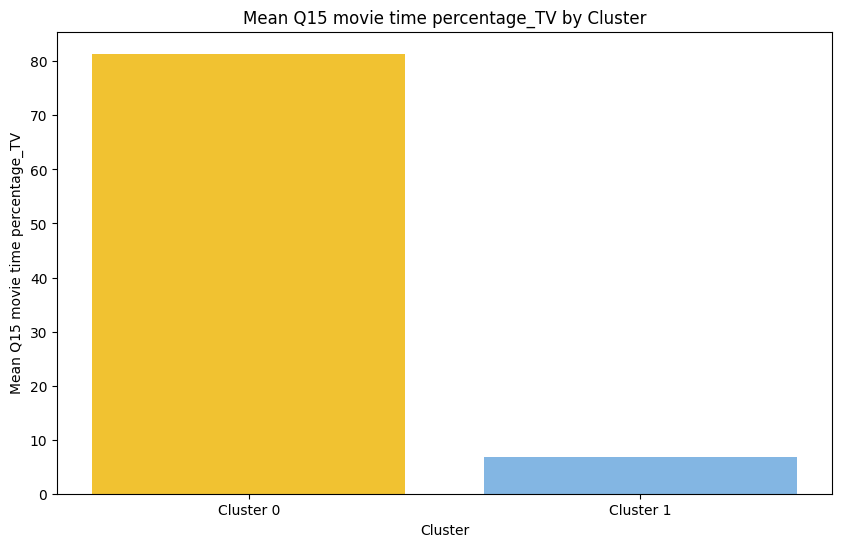

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q15 movie time percentage_TV'], color=colors[:df_centers.shape[0]])
plt.title('Mean Q15 movie time percentage_TV by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q15 movie time percentage_TV')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

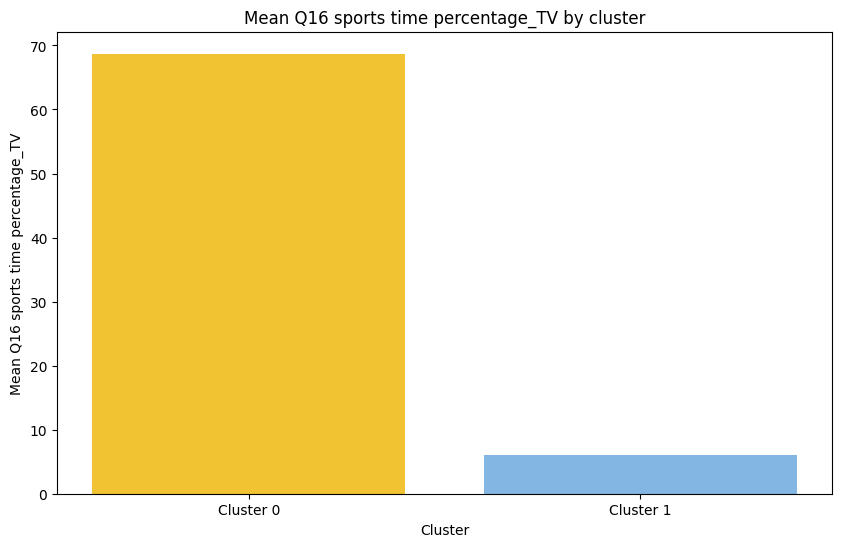

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q16 sports time percentage_TV'], color=colors[:df_centers.shape[0]])  # Use slicing in case there are fewer clusters than colors
plt.title('Mean Q16 sports time percentage_TV by cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q16 sports time percentage_TV')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

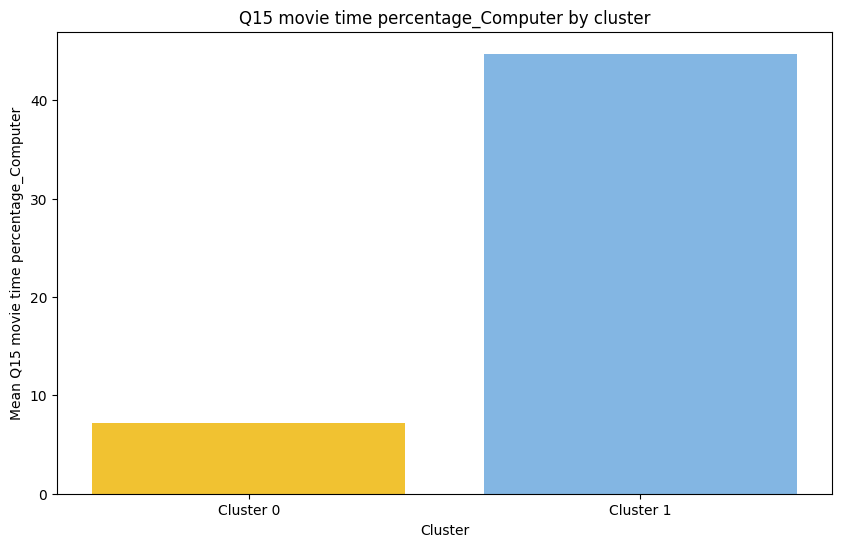

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q15 movie time percentage_Computer'], color=colors[:df_centers.shape[0]])  # Use slicing in case there are fewer clusters than colors
plt.title('Q15 movie time percentage_Computer by cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q15 movie time percentage_Computer')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

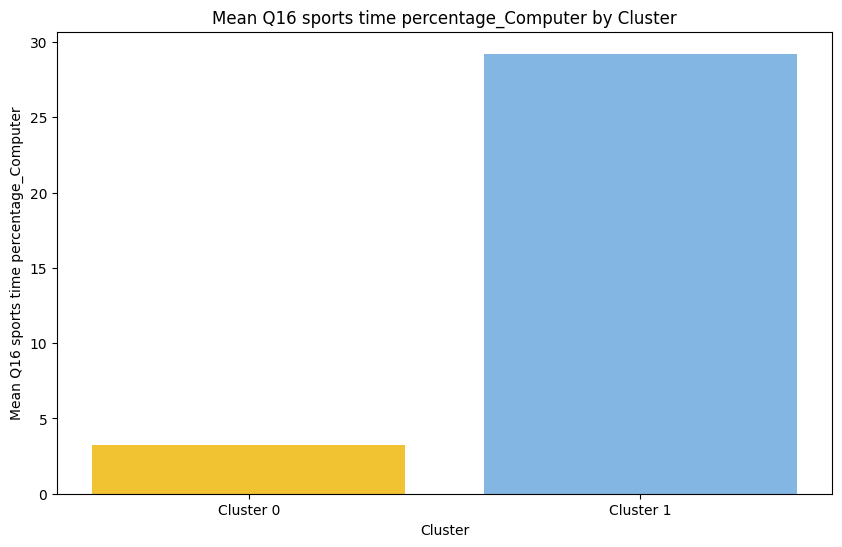

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q16 sports time percentage_Computer'], color=colors[:df_centers.shape[0]])  # Use slicing in case there are fewer clusters than colors
plt.title('Mean Q16 sports time percentage_Computer by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q16 sports time percentage_Computer')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

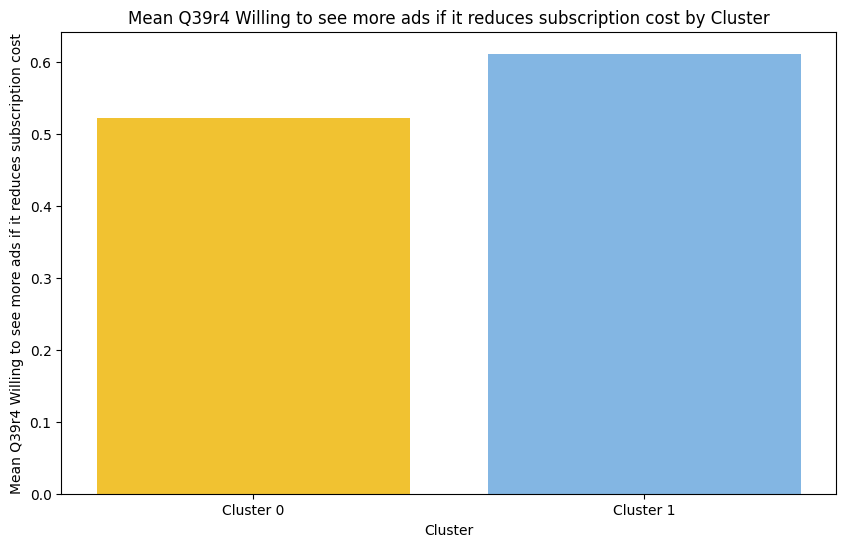

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q39r4 Willing to see more ads if it reduces subscription cost'], color=colors[:df_centers.shape[0]])  # Use slicing in case there are fewer clusters than colors
plt.title('Mean Q39r4 Willing to see more ads if it reduces subscription cost by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q39r4 Willing to see more ads if it reduces subscription cost')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

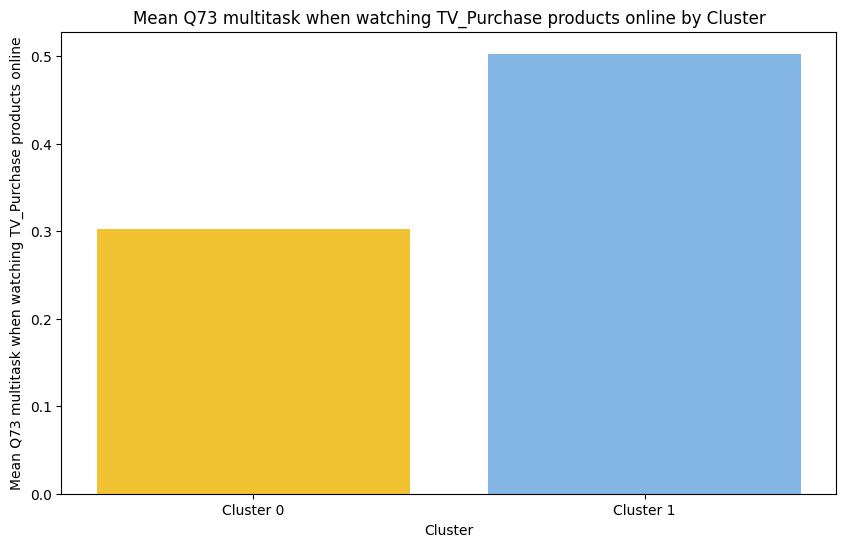

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']
plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q73 multitask when watching TV_Purchase products online'], color=colors[:df_centers.shape[0]])
plt.title('Mean Q73 multitask when watching TV_Purchase products online by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q73 multitask when watching TV_Purchase products online')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()

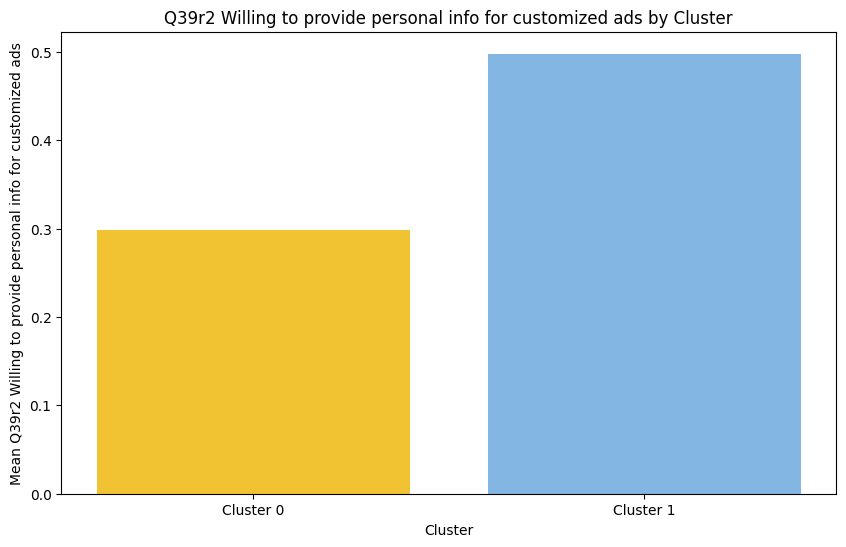

In [ ]:
import matplotlib.pyplot as plt

colors = ['#f1c231', '#83B6E3']

plt.figure(figsize=(10, 6))
plt.bar(df_centers.index, df_centers['Q39r2 Willing to provide personal info for customized ads'], color=colors[:df_centers.shape[0]])  # Use slicing in case there are fewer clusters than colors
plt.title('Q39r2 Willing to provide personal info for customized ads by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Q39r2 Willing to provide personal info for customized ads')
plt.xticks(ticks=range(df_centers.shape[0]), labels=[f'Cluster {i}' for i in df_centers.index])
plt.show()